In [1]:
import pandas as pd 
import numpy as np
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt 
from rasterio.plot import reshape_as_image
import os 
from rasterio.mask import mask 
import json
from shapely.geometry import MultiPolygon, Polygon
import fiona as fi
from shapely.geometry import shape
import ntpath
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
from PIL import Image
import pyfeats as ft

In [2]:
raster_path = r"D:\isleño_mix\Repro\20240211_Orotmosaico_transparent_mosaic_Reprojectada.tif"


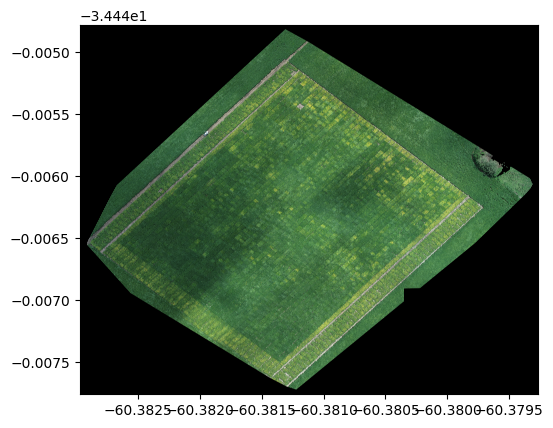

<Axes: >

In [3]:
raster = rasterio.open(raster_path)
show(raster)

In [ ]:
raster.read(1)

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [4]:
with rasterio.open(raster_path) as src:
    img = reshape_as_image(src.read())
    meta = src.meta

In [5]:
meta

{'driver': 'GTiff',
 'dtype': 'uint8',
 'nodata': None,
 'width': 15708,
 'height': 12655,
 'count': 4,
 'crs': CRS.from_epsg(4326),
 'transform': Affine(2.3579042526123494e-07, 0.0, -60.382969506,
        0.0, -2.3579035954131883e-07, -34.444778237)}

In [6]:
img.shape

(12655, 15708, 4)

In [7]:
red = img[: , : , 0 ]
green = img[: , : , 1 ]
blue = img[: , : , 2 ]

In [8]:
rgb = np.dstack((red,green,blue))


(-0.5, 15707.5, 12654.5, -0.5)

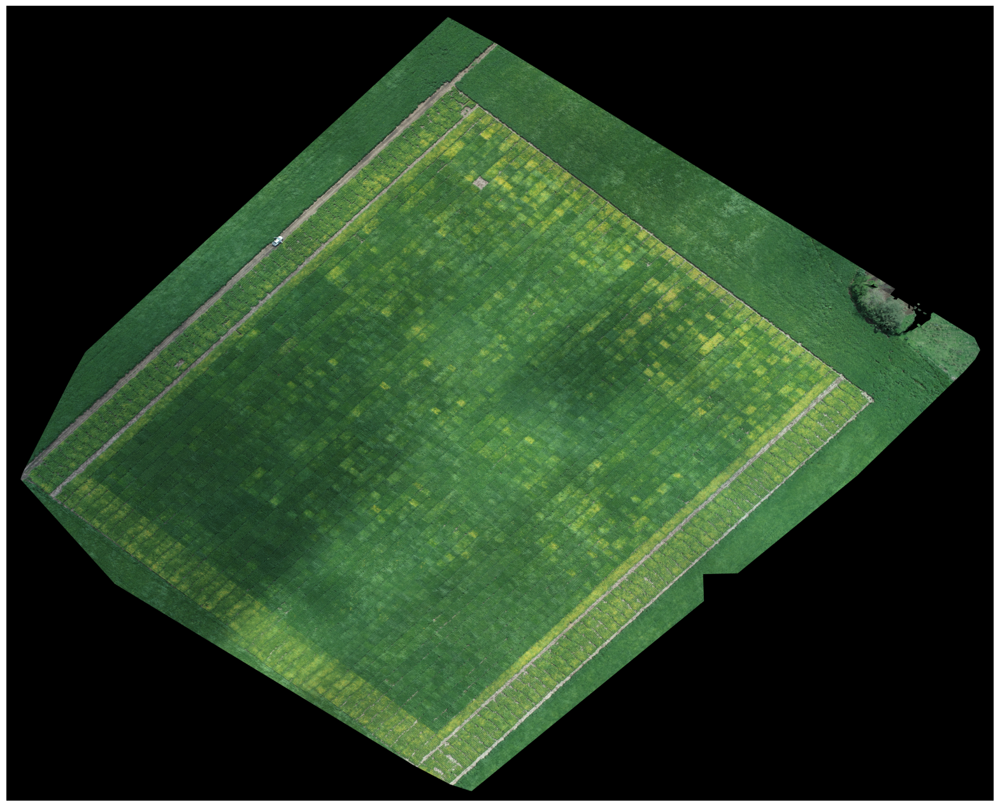

In [9]:
plt.figure(figsize=(20,20))
plt.imshow(rgb)
plt.axis('off')

In [10]:
## convirtiendo los tipos de datos desde uint8 a float 
# y permitiendo la division por 0 
red = red.astype(float)
green = green.astype(float)
blue = blue.astype(float)
np.seterr(divide='ignore', invalid='ignore')

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

In [11]:
check = np.logical_or ( red > 0, blue > 0, green > 0 )

In [12]:
VDVI = np.where ( check,  (2*green-red-blue)/(2*green + red + blue),-1)

(-0.5, 15707.5, 12654.5, -0.5)

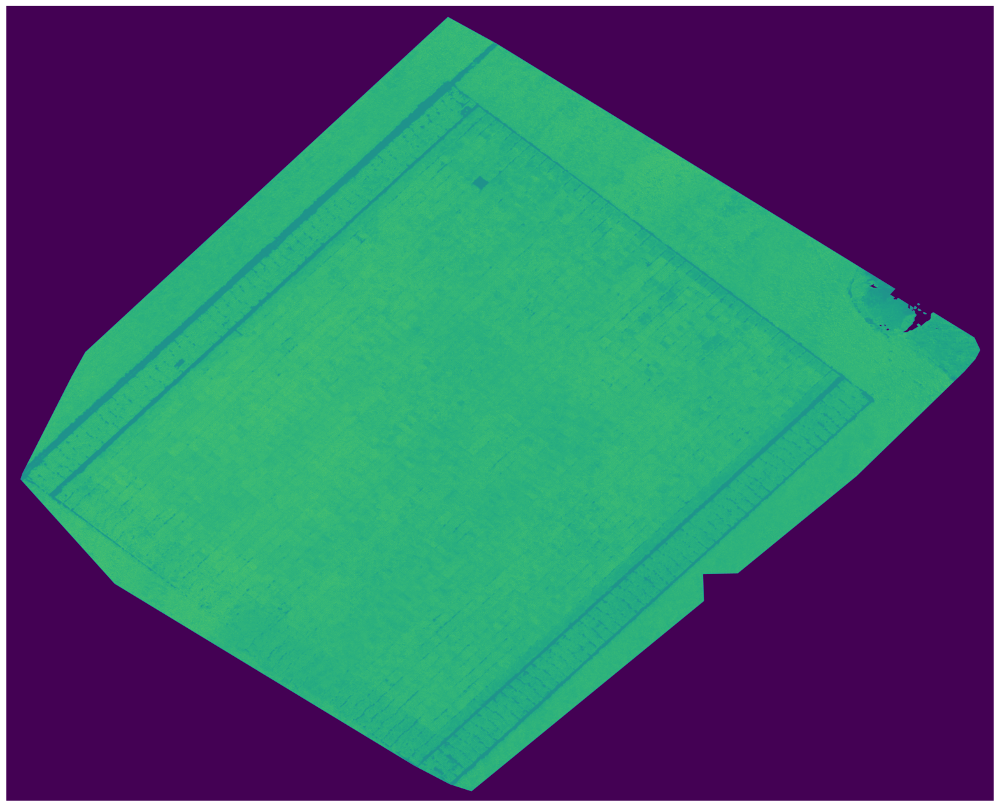

In [13]:
plt.figure(figsize=(20,20))
plt.imshow(VDVI*8)
plt.axis('off')

In [14]:
np.max(VDVI)

0.9753086419753086

In [15]:
from rasterio.mask import mask 
import json
from shapely.geometry import MultiPolygon, Polygon
import fiona as fi
from shapely.geometry import shape

In [3]:
plotgrids = open(r'F:\isleño_mix\Grilla_aoi_reproy.geojson')
plotgrids = json.load(plotgrids)

In [4]:
plotgrids['crs']

{'type': 'name', 'properties': {'name': 'urn:ogc:def:crs:OGC:1.3:CRS84'}}

In [18]:
from rasterio import CRS

In [6]:
plotgrids = open(r'F:\isleño_mix\Grid_Aoi.geojson')
plotgrids = json.load(plotgrids)

In [7]:
plotgrids['crs']

{'type': 'name', 'properties': {'name': 'urn:ogc:def:crs:EPSG::32720'}}

In [14]:
coords1 = plotgrids['features'][0]['geometry']['coordinates'][0]
coords2 = plotgrids['features'][1]['geometry']['coordinates'][0]
coords3 = plotgrids['features'][2]['geometry']['coordinates'][0]
coords4 = plotgrids['features'][3]['geometry']['coordinates'][0]

In [15]:
coords1

[[740603.4384002349, 6185363.268036062],
 [740601.5050550108, 6185365.006476813],
 [740602.7085909151, 6185366.344946584],
 [740604.6419361392, 6185364.606505833],
 [740603.4384002349, 6185363.268036062]]

In [16]:
pol1 =Polygon(coords1)
pol2 =Polygon(coords2)
pol3 =Polygon(coords3)
pol4 =Polygon(coords4)


In [17]:
mpol1 = MultiPolygon([pol1])

In [9]:
srcRst = rasterio.open(r'F:\isleño_mix\Orthomosaics\20240311_Ortomosaico_transparent_mosaic_py.tif')
print("source raster crs:")
print(srcRst.crs)

source raster crs:
EPSG:32720


In [18]:
srcRst.bounds

BoundingBox(left=740431.9964279595, bottom=6185079.155623224, right=740780.9304967476, top=6185418.954306135)

In [19]:
with rasterio.open(r'F:\isleño_mix\Orthomosaics\20240311_Ortomosaico_transparent_mosaic_py.tif') as src:
    src.meta['transform'] =src.meta['transform'].rotation(45)
    data,_=rasterio.mask.mask(src,shapes=mpol1.geoms,crop=True)
    

In [20]:
pl = np.dstack([data[0].astype(float),data[1].astype(float),data[2].astype(float)])

In [21]:
data1 = pl / pl.max() #normalizes data in range 0 - 255
data1 = 255 * data1
img = data1.astype(np.uint8)

In [22]:
src

<closed DatasetReader name='F:/isleño_mix/Orthomosaics/20240311_Ortomosaico_transparent_mosaic_py.tif' mode='r'>

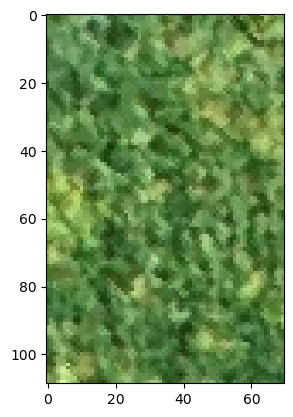

In [23]:
img1 = Image.fromarray(img, 'RGB')
plt.gcf().set_facecolor("white")
plt.imshow(img1.rotate(-48).crop((30,11,100,120)))

In [24]:
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling

In [ ]:
srcRst = rasterio.open()
print("source raster crs:")
print(srcRst.crs)

source raster crs:
EPSG:32720


In [4]:
#open source raster
srcRst = rasterio.open(r'D:\isleño_mix\Orthomosaics\20240311_Ortomosaico_transparent_mosaic_group1_modified.tif')
print("source raster crs:")
print(srcRst.crs)


source raster crs:
EPSG:32720


In [ ]:
#source raster crs:
dstCrs = {'init': 'EPSG:32720'}
print("destination raster crs:")
print(dstCrs)

destination raster crs:
{'init': 'EPSG:32720'}


In [ ]:

#calculate transform array and shape of reprojected raster
transform, width, height = calculate_default_transform(
        srcRst.crs, dstCrs, srcRst.width, srcRst.height, *srcRst.bounds)
print("transform array of source raster")
print(srcRst.transform)

print("transform array of destination raster")
print(transform)

transform array of source raster
| 0.02, 0.00, 740440.33|
| 0.00,-0.02, 6185410.36|
| 0.00, 0.00, 1.00|
transform array of destination raster
| 0.02, 0.00, 740440.33|
| 0.00,-0.02, 6185410.36|
| 0.00, 0.00, 1.00|


In [ ]:
#working of the meta for the destination raster
kwargs = srcRst.meta.copy()
kwargs.update({
        'crs': dstCrs,
        'transform': transform,
        'width': width,
        'height': height
    })

In [110]:
#open destination raster
dstRst = rasterio.open(r'D:\isleño_mix\Orthomosaics\20240311_Ortomosaico_transparent_mosaic_py.tif', 'w', **kwargs)
#reproject and save raster band data
for i in range(1, srcRst.count + 1):
    reproject(
        source=rasterio.band(srcRst, i),
        destination=rasterio.band(dstRst, i),
        #src_transform=srcRst.transform,
        src_crs=srcRst.crs,
        #dst_transform=transform,
        dst_crs=dstCrs,
        resampling=Resampling.nearest)
#close destination raster
dstRst.close()

In [ ]:


#open destination raster
dstRst = rasterio.open('../outputRaster/landsatImageWgs84.tif', 'w', **kwargs)
#reproject and save raster band data
for i in range(1, srcRst.count + 1):
    reproject(
        source=rasterio.band(srcRst, i),
        destination=rasterio.band(dstRst, i),
        #src_transform=srcRst.transform,
        src_crs=srcRst.crs,
        #dst_transform=transform,
        dst_crs=dstCrs,
        resampling=Resampling.nearest)
#close destination raster
dstRst.close()

In [ ]:
plotgrids = open(r'D:\isleño_mix\Grid_Aoi.geojson')
plotgrids = json.load(plotgrids)

In [ ]:
coords1 = plotgrids['features'][0]['geometry']['coordinates'][0]
coords2 = plotgrids['features'][1]['geometry']['coordinates'][0]
coords3 = plotgrids['features'][2]['geometry']['coordinates'][0]
coords4 = plotgrids['features'][3]['geometry']['coordinates'][0]
pol1 =Polygon(coords1)
pol2 =Polygon(coords2)
pol3 =Polygon(coords3)
pol4 =Polygon(coords4)
mpol1 = MultiPolygon([pol4])

In [179]:
with rasterio.open(r'D:\isleño_mix\Modificado\20240315_Ortomosaico_transparent_mosaic_group1_modificado.tif') as src:
    #src.meta['transform'] =src.meta['transform'].rotation(45)
    data,_=rasterio.mask.mask(src,shapes=mpol1.geoms,crop=True)
    print(src.meta['crs'])

EPSG:32720


In [ ]:
pl = np.dstack([data[0],data[1],data[2]])

In [ ]:
red1 = data[0]
green1 = data[1]
blue1 =  data[2]

In [ ]:
pl1 = np.dstack([data[0].astype(float),data[1].astype(float),data[2].astype(float)])

In [ ]:


data1 = pl1 / pl1.max() #normalizes data in range 0 - 255
data1 = 255 * data1
img = data1.astype(np.uint8)

In [5]:
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
from PIL import Image
import pyfeats

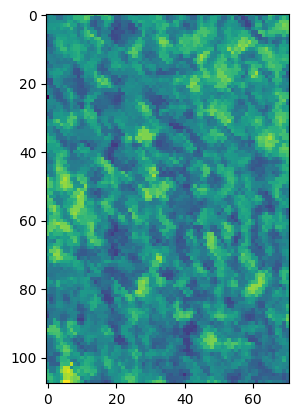

In [125]:
img1 = Image.fromarray(img, 'RGB')
img1 = img1.rotate(-48).crop((29,12,100,120)).convert('L')
plt.imshow(img1)

In [127]:

red, green, blue = Image.fromarray(img, 'RGB').rotate(-48).crop((30,12,108,122)).split()
red = np.asarray(red)
green = np.asarray(green)
blue = np.asarray(blue)


In [130]:
vdvi1  = (2 * green - red - blue)/(2 * green + red + blue)
vdvi1 = vdvi1 / vdvi1.max() #normalizes data in range 0 - 255
#vdvi1 = 255 * vdvi1
#vdvi2 = vdvi1.astype(np.uint8)

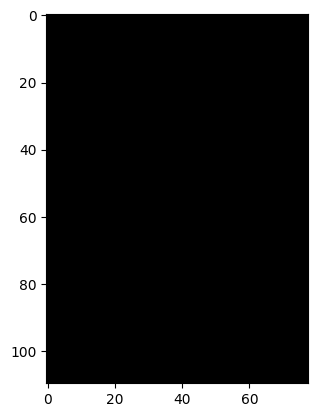

In [131]:

plt.imshow(Image.fromarray(vdvi1))

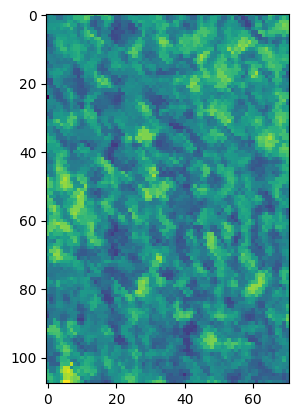

In [123]:
img1 = Image.fromarray(img, 'RGB')
img1 = img1.rotate(-48).crop((29,12,100,120)).convert('L')
plt.imshow(img1)

In [25]:
import pyfeats as ft 


In [135]:
np.array(img1)

array([[105, 115,  87, ..., 109, 129, 129],
       [105, 115, 116, ..., 133, 159, 137],
       [103, 116, 116, ..., 174, 174, 174],
       ...,
       [159, 145, 119, ...,  83,  65,  78],
       [159, 157, 133, ...,  78,  61,  78],
       [108, 150, 135, ...,  98,  83,  69]], dtype=uint8)

In [140]:
features_mean, features_range, labels_mean, labels_range = ft.glcm_features(np.array(img1), ignore_zeros=True)

In [141]:
features_range


array([1.28306140e-04, 2.76968905e+02, 1.49402512e-01, 3.27133985e+00,
       8.00092368e-02, 1.34198176e-01, 2.75720341e+02, 5.88777012e-02,
       2.83318718e-01, 6.43384421e-05, 4.29875040e-01, 4.09896181e-02,
       1.80399040e-02, 7.58054271e-01])

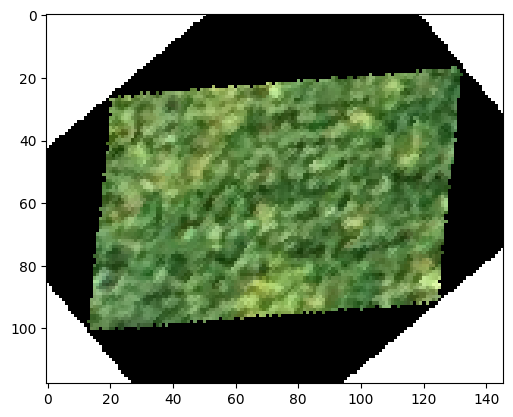

In [ ]:
#im = img1.convert('RGBA')
#data = np.array(im)
# just use the rgb values for comparison
rgb = data1
color = [246, 213, 139]   # Original value
black = [0,0,0, 255]
white = [255,255,255,255]
mask = np.all(rgb == color, axis = -1)
# change all pixels that match color to white
data[mask] = white

# change all pixels that don't match color to black
##data[np.logical_not(mask)] = black
new_im = Image.fromarray(data)
plt.imshow(new_im)

In [2]:
import ntpath


In [3]:
def read_grid(gpath):
    dics = {}
    if (gpath.split('.')[1] == 'geojson'): 
        plotgrids = open(gpath)
        plotgrids = json.load(plotgrids)
        crs_coords = plotgrids['crs']['properties']['name']

        for p in plotgrids['features']:
            dics[str(p['properties']['fid'])] = p['geometry']['coordinates'][0]

        return crs_coords, dics

    else: 
        print("It's not a geojson file")
        return 

In [4]:
crs_coord, plots_coord = read_grid(r'D:\isleño_mix\Grilla_aoi_reproy.geojson')

In [5]:
def make_shape(coords):
    pol1 = Polygon(coords)
    mplo1 = MultiPolygon([pol1])
    
    return mplo1.geoms

In [6]:
def calculate_vdvi(red,green,blue):
    return round((2 * green - red - blue)/(2 * green + red + blue),3)

def calculate_excess_greenness_index(red,green,blue):
    return round(2 * green - (red + blue), 2)

def calculate_cive(red,green,blue):

    return round(0.441 * red - 0.811 * green + 0.385 * blue + 18.78745, 2)

def calculate_normalized_difference_index(red,green):
    """
    Calculates the normalized difference index of an image
    """
    return round(128 * ((green - red) / (green + red)) + 1, 2)

def calculate_vegetative_index(red,green,blue):
    return round(green / ((red ** 0.667) * (blue ** .333)), 2)

def calculate_ngrdi(red,green):
    return  round((green - red) / (green + red), 2)


In [7]:
from PIL import Image

In [8]:
def check_crop_angle(rst_path, gpath, rangle = 0, crop=(), plotpos = 0,  to_uint8 = False):
    plotgrids = open(gpath)
    plotgrids = json.load(plotgrids)
    pol1 =Polygon(plotgrids['features'][plotpos]['geometry']['coordinates'][0])
    mpol1 = MultiPolygon([pol1])

    with rasterio.open(rst_path) as src:
        masked_rast,_=rasterio.mask.mask(src,shapes=mpol1.geoms,crop=True)

    red = masked_rast[0]
    green = masked_rast[1]
    blue =  masked_rast[2]
    bands_stacked = np.dstack([red,green,blue])
    if (to_uint8):
        bands_stacked_norm = bands_stacked / bands_stacked.max() #normalizes data in range 0 - 255
        bands_stacked_norm = 255 * bands_stacked_norm
        img = Image.fromarray(bands_stacked_norm.astype(np.uint8))
    else:
        img = Image.fromarray(bands_stacked)

    if len(crop) == 4 :
        plt.imshow(img.rotate(rangle).crop(crop))
        return rangle, crop
    
    else:
        plt.imshow(img.rotate(rangle))
        return rangle, crop 

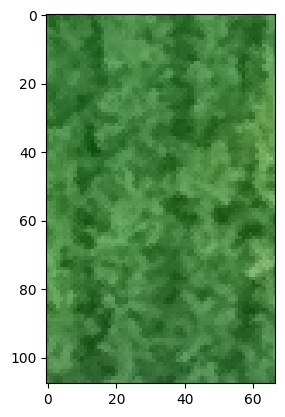

In [9]:
opath_1 = r'D:\isleño_mix\Modificado\20240315_Ortomosaico_transparent_mosaic_group1_modificado.tif'
gpath_1 = r'D:\isleño_mix\Grid_Aoi.geojson'
p, g = check_crop_angle(opath_1,gpath_1,rangle = -48, crop=(33,12,100,120), plotpos= 11)

In [10]:
def extract_image_from_raster(rst_path, gpath, plotpos):

    plotgrids = open(gpath)
    plotgrids = json.load(plotgrids)
    pol1 =Polygon(plotgrids['features'][plotpos]['geometry']['coordinates'][0])
    mpol1 = MultiPolygon([pol1])

    with rasterio.open(rst_path) as src:
        masked_rast,_=rasterio.mask.mask(src,shapes=mpol1.geoms,crop=True)

    red = masked_rast[0]
    green = masked_rast[1]
    blue =  masked_rast[2]
    bands_stacked = np.dstack([red,green,blue])
    bands_stacked_norm = bands_stacked / bands_stacked.max() #normalizes data in range 0 - 255
    bands_stacked_norm = 255 * bands_stacked_norm
    img = Image.fromarray(bands_stacked_norm.astype(np.uint8), 'RGB')
  
    return img

In [11]:
def extract_image_from_raster_v2(raster_data, multiplot, rangle, crop):
    masked_rast,aff = rasterio.mask.mask(raster_data,multiplot.geoms, crop=True)
    
    red = masked_rast[0]
    green = masked_rast[1]
    blue =  masked_rast[2]
    bands_stacked = np.dstack([red,green,blue])
    bands_stacked_norm = bands_stacked / bands_stacked.max() #normalizes data in range 0 - 255
    bands_stacked_norm = 255 * bands_stacked_norm
    img = Image.fromarray(bands_stacked_norm.astype(np.uint8), 'RGB')
  
    if len(crop) == 4 :
        return img.rotate(rangle).crop(crop)
        
    
    else: 
        return img.rotate(rangle)

In [13]:
def extract_raster_data(rasta_path, grid_path, rangle, crop):

    grid_crs, grids = read_grid(grid_path)
    valriables_dic = {'fid':[],
    'Date':[],
    'VDVI':[],
    'EGI':[],
    'CIVE':[],
    'NDI':[],
    'VI':[],
    'NGRDI':[],
    'GLCM_ASM_Mean':[],
    'GLCM_Contrast_Mean':[],
    'GLCM_Correlation_Mean':[],
    'GLCM_SumOfSquaresVariance_Mean':[],
    'GLCM_InverseDifferenceMoment_Mean':[],
    'GLCM_SumAverage_Mean':[],
    'GLCM_SumVariance_Mean':[],
    'GLCM_SumEntropy_Mean':[],
    'GLCM_Entropy_Mean':[],
    'GLCM_DifferenceVariance_Mean':[],
    'GLCM_DifferenceEntropy_Mean':[],
    'GLCM_Information1_Mean':[],
    'GLCM_Information2_Mean':[],
    'GLCM_MaximalCorrelationCoefficient_Mean':[]}
    
    print(f'Grid Coords system: {grid_crs}')
    with rasterio.open(rasta_path) as crs:
        for g in grids.keys() :
            if int(g) == 1: 
                coords = crs.meta['crs']
                print(f'Raster Coords system: {coords}')
                
            rimage = extract_image_from_raster_v2(crs,MultiPolygon([Polygon(grids[g])]) )    

            
            # Textural features extraction
            features_mean, features_range, labels_mean, labels_range = ft.glcm_features(np.array(rimage.convert('L')), ignore_zeros=True)
            valriables_dic['GLCM_ASM_Mean'].append(features_mean[0])
            valriables_dic['GLCM_Contrast_Mean'].append(features_mean[1])
            valriables_dic['GLCM_Correlation_Mean'].append(features_mean[2])
            valriables_dic['GLCM_SumOfSquaresVariance_Mean'].append(features_mean[3])
            valriables_dic['GLCM_InverseDifferenceMoment_Mean'].append(features_mean[4])
            valriables_dic['GLCM_SumAverage_Mean'].append(features_mean[5])
            valriables_dic['GLCM_SumVariance_Mean'].append(features_mean[6])
            valriables_dic['GLCM_SumEntropy_Mean'].append(features_mean[7])
            valriables_dic['GLCM_Entropy_Mean'].append(features_mean[8])
            valriables_dic['GLCM_DifferenceVariance_Mean'].append(features_mean[9])
            valriables_dic['GLCM_DifferenceEntropy_Mean'].append(features_mean[10])
            valriables_dic['GLCM_Information1_Mean'].append(features_mean[11])
            valriables_dic['GLCM_Information2_Mean'].append(features_mean[12])
            valriables_dic['GLCM_MaximalCorrelationCoefficient_Mean'].append(features_mean[13])

            # Vegetation index extraction 
            red, green, blue = rimage.split()
            red = round(np.average(red),2)
            green = round(np.average(green),2)
            blue =  round(np.average(blue),2)
            valriables_dic['Date'].append(ntpath.basename(rasta_path).split('_')[0])
            valriables_dic['fid'].append(g)
            valriables_dic['VDVI'].append(calculate_vdvi(red,green,blue))
            valriables_dic['EGI'].append(calculate_excess_greenness_index(red,green,blue))
            valriables_dic['CIVE'].append(calculate_cive(red,green,blue))
            valriables_dic['NDI'].append(calculate_normalized_difference_index(red,green))
            valriables_dic['VI'].append(calculate_vegetative_index(red,green,blue))
            valriables_dic['NGRDI'].append(calculate_ngrdi(red,green))
            
            
    
    return pd.DataFrame(valriables_dic)

In [15]:
def extract_raster_data_images(rasta_path, grid_path, rangle, crop, plot_id):

    grid_crs, grids = read_grid(grid_path)
    image_saved = []
    valriables_dic = {'fid':[],
    'Date':[],
    'VDVI':[],
    'EGI':[],
    'CIVE':[],
    'NDI':[],
    'VI':[],
    'NGRDI':[],
    'GLCM_ASM_Mean':[],
    'GLCM_Contrast_Mean':[],
    'GLCM_Correlation_Mean':[],
    'GLCM_SumOfSquaresVariance_Mean':[],
    'GLCM_InverseDifferenceMoment_Mean':[],
    'GLCM_SumAverage_Mean':[],
    'GLCM_SumVariance_Mean':[],
    'GLCM_SumEntropy_Mean':[],
    'GLCM_Entropy_Mean':[],
    'GLCM_DifferenceVariance_Mean':[],
    'GLCM_DifferenceEntropy_Mean':[],
    'GLCM_Information1_Mean':[],
    'GLCM_Information2_Mean':[],
    'GLCM_MaximalCorrelationCoefficient_Mean':[]}
    
    print(f'Grid Coords system: {grid_crs}')
    with rasterio.open(rasta_path) as crs:
        for g in grids.keys() :

            if int(g) == plot_id:
             
                rimage = extract_image_from_raster_v2(crs,MultiPolygon([Polygon(grids[g])]),rangle, crop)    

                image_saved.append(rimage)
                

                # Textural features extraction
                features_mean, features_range, labels_mean, labels_range = ft.glcm_features(np.array(rimage.convert('L')),
                                                                                             ignore_zeros=True)
                valriables_dic['GLCM_ASM_Mean'].append(features_mean[0])
                valriables_dic['GLCM_Contrast_Mean'].append(features_mean[1])
                valriables_dic['GLCM_Correlation_Mean'].append(features_mean[2])
                valriables_dic['GLCM_SumOfSquaresVariance_Mean'].append(features_mean[3])
                valriables_dic['GLCM_InverseDifferenceMoment_Mean'].append(features_mean[4])
                valriables_dic['GLCM_SumAverage_Mean'].append(features_mean[5])
                valriables_dic['GLCM_SumVariance_Mean'].append(features_mean[6])
                valriables_dic['GLCM_SumEntropy_Mean'].append(features_mean[7])
                valriables_dic['GLCM_Entropy_Mean'].append(features_mean[8])
                valriables_dic['GLCM_DifferenceVariance_Mean'].append(features_mean[9])
                valriables_dic['GLCM_DifferenceEntropy_Mean'].append(features_mean[10])
                valriables_dic['GLCM_Information1_Mean'].append(features_mean[11])
                valriables_dic['GLCM_Information2_Mean'].append(features_mean[12])
                valriables_dic['GLCM_MaximalCorrelationCoefficient_Mean'].append(features_mean[13])

                # Vegetation index extraction 
                red, green, blue = rimage.split()
                red = round(np.average(red),2)
                green = round(np.average(green),2)
                blue =  round(np.average(blue),2)
                valriables_dic['Date'].append(ntpath.basename(rasta_path).split('_')[0])
                valriables_dic['fid'].append(g)
                valriables_dic['VDVI'].append(calculate_vdvi(red,green,blue))
                valriables_dic['EGI'].append(calculate_excess_greenness_index(red,green,blue))
                valriables_dic['CIVE'].append(calculate_cive(red,green,blue))
                valriables_dic['NDI'].append(calculate_normalized_difference_index(red,green))
                valriables_dic['VI'].append(calculate_vegetative_index(red,green,blue))
                valriables_dic['NGRDI'].append(calculate_ngrdi(red,green))
            
            
    
    return pd.DataFrame(valriables_dic), image_saved

In [16]:
values_p, im  = extract_raster_data_images(r'D:\isleño_mix\Modificado\20240315_Ortomosaico_transparent_mosaic_group1_modificado.tif', 
                               r'D:\isleño_mix\Grid_Aoi.geojson', -48,(40,12,100,120), 5)

Grid Coords system: urn:ogc:def:crs:EPSG::32720


In [17]:
values_p

,fid,Date,VDVI,EGI,CIVE,NDI,VI,NGRDI,GLCM_ASM_Mean,GLCM_Contrast_Mean,...,GLCM_InverseDifferenceMoment_Mean,GLCM_SumAverage_Mean,GLCM_SumVariance_Mean,GLCM_SumEntropy_Mean,GLCM_Entropy_Mean,GLCM_DifferenceVariance_Mean,GLCM_DifferenceEntropy_Mean,GLCM_Information1_Mean,GLCM_Information2_Mean,GLCM_MaximalCorrelationCoefficient_Mean
0,5,20240315,0.364,187.69,-55.84,44.64,2.11,0.34,0.000364,282.212776,...,0.123321,275.35607,1991.58768,7.481377,11.90883,0.000158,5.081207,-0.192555,0.95831,4.487255


In [18]:
import matplotlib.pyplot as plt 
import seaborn as sns 

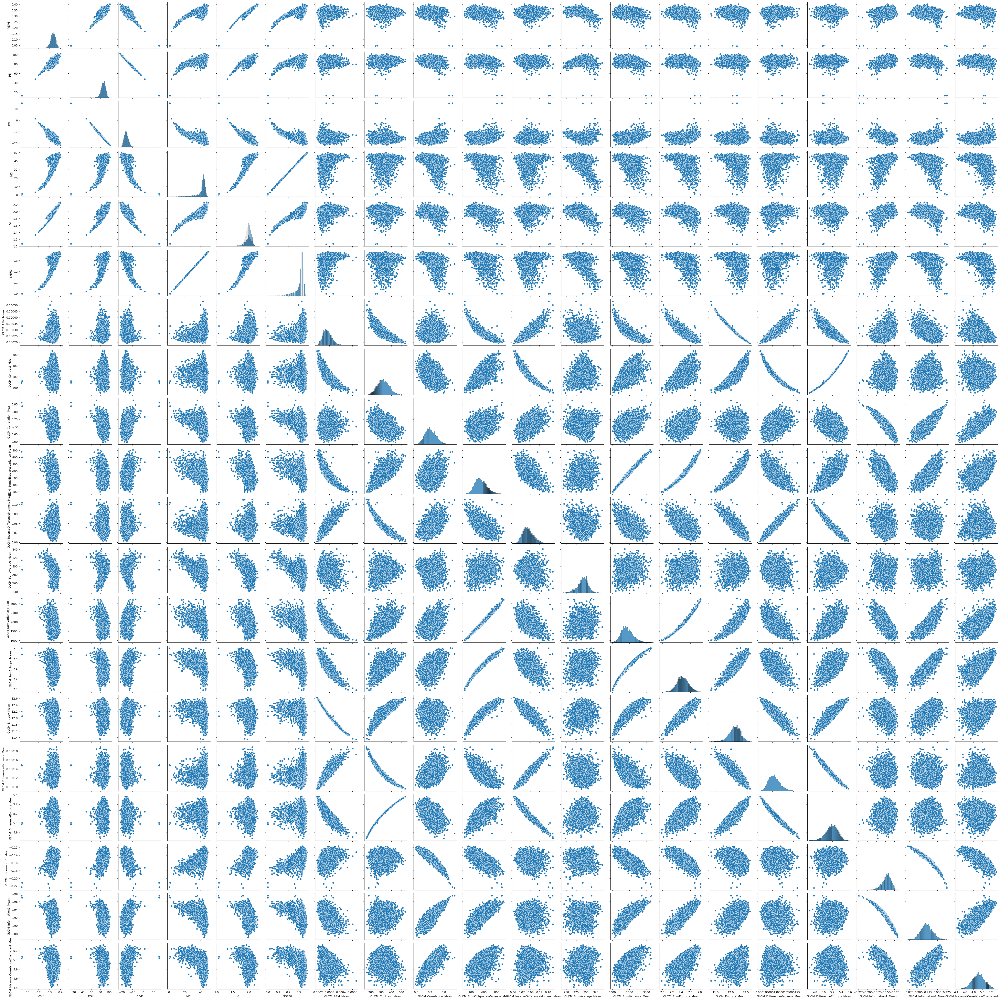

In [203]:
sns.pairplot(values_p)

In [229]:
r'D:\isleño_mix\Modificado'

'D:\\isleño_mix\\Modificado'

In [19]:
fold_path = r'D:\isleño_mix\Modificado'

In [20]:
def get_tiff_files(fold_path):
    tiff_list = []
    for file in os.listdir(fold_path): 

        if os.path.basename(file).split('.',1)[1] == 'tif':
            tiff_list.append(file)
    
    return tiff_list

In [22]:
def procces_stack_tiff( folder_path, grid_path, rangle, crop ):
    tif_list = get_tiff_files(folder_path)
    features_dict = {}
    for tiff_pos,tiff_file in enumerate(tif_list):
        print(f'{tiff_pos + 1 }/{len(tif_list)} : {tiff_file}')
        features_dict[tiff_file] = extract_raster_data(folder_path + '/' + tiff_file, grid_path, rangle, crop )
    return features_dict

In [23]:
def extract_time_series_images( folder_path, grid_path, rangle, crop,plot_id ):
    tif_list = get_tiff_files(folder_path)
    features_dataframe = pd.DataFrame()
    image_dict = {}
    for tiff_pos,tiff_file in enumerate(tif_list):

        print(f'{tiff_pos + 1 }/{len(tif_list)} : {tiff_file}')

        if tiff_pos == 0 :
            features_dataframe, image_rgb = extract_raster_data_images(folder_path + '/' + tiff_file, grid_path, rangle, crop, plot_id )
            image_dict[tiff_file.split("_")[0]] = image_rgb[0]
        else:
            df, image_rgb = extract_raster_data_images(folder_path + '/' + tiff_file, grid_path, rangle, crop, plot_id )
            features_dataframe = pd.concat([features_dataframe,df], axis= 0)
            image_dict[tiff_file.split("_")[0]] = image_rgb[0]

    features_dataframe['date_num']=pd.DatetimeIndex(features_dataframe.Date).to_julian_date() - pd.DatetimeIndex(features_dataframe.Date).to_julian_date().min()
    features_dataframe['date_num']= features_dataframe.date_num.astype(int)
    
    return features_dataframe, image_dict

In [24]:
df , imlist = extract_time_series_images('D:/isleño_mix/Modificado', r'D:\isleño_mix\Grid_Aoi.geojson', -48,(29,12,100,120), 5)

1/8 : 20240405_Orotmosaico_transparent_mosaic_group1_modificado.tif
Grid Coords system: urn:ogc:def:crs:EPSG::32720
2/8 : 20240401_Ortomosaico_transparent_mosaic_group1_modificado.tif
Grid Coords system: urn:ogc:def:crs:EPSG::32720
3/8 : 20240328_Ortomosaico_transparent_mosaic_group1_modificado.tif
Grid Coords system: urn:ogc:def:crs:EPSG::32720
4/8 : 20240325_Ortomosaico_transparent_mosaic_group1_modificado.tif
Grid Coords system: urn:ogc:def:crs:EPSG::32720
5/8 : 20240322_Ortomosaico_transparent_mosaic_group1_modificado.tif
Grid Coords system: urn:ogc:def:crs:EPSG::32720
6/8 : 20240318_Ortomosaico_transparent_mosaic_group1_modificado.tif
Grid Coords system: urn:ogc:def:crs:EPSG::32720
7/8 : 20240315_Ortomosaico_transparent_mosaic_group1_modificado.tif
Grid Coords system: urn:ogc:def:crs:EPSG::32720
8/8 : 20240311_Ortomosaico_transparent_mosaic_group1.tif
Grid Coords system: urn:ogc:def:crs:EPSG::32720


In [25]:
imlist

{'20240405': <PIL.Image.Image image mode=RGB size=71x108>,
 '20240401': <PIL.Image.Image image mode=RGB size=71x108>,
 '20240328': <PIL.Image.Image image mode=RGB size=71x108>,
 '20240325': <PIL.Image.Image image mode=RGB size=71x108>,
 '20240322': <PIL.Image.Image image mode=RGB size=71x108>,
 '20240318': <PIL.Image.Image image mode=RGB size=71x108>,
 '20240315': <PIL.Image.Image image mode=RGB size=71x108>,
 '20240311': <PIL.Image.Image image mode=RGB size=71x108>}

In [26]:
df.date_num

0    25
0    21
0    17
0    14
0    11
0     7
0     4
0     0
Name: date_num, dtype: int32

In [27]:
import seaborn as sns 

In [33]:
len(imlist)

8

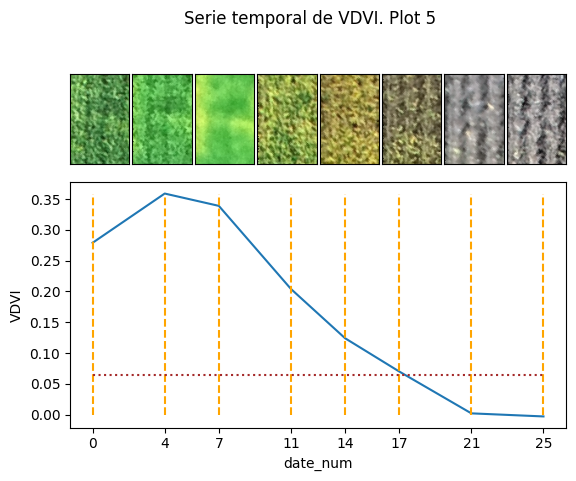

In [69]:
import matplotlib.pyplot as plt

fig = plt.figure()
plt.suptitle(f"Serie temporal de VDVI. Plot {df.fid.values[0]}")

gs = fig.add_gridspec(2,8,height_ratios=[1,2], wspace=0.05, hspace= 0.01)

ax1 = fig.add_subplot(gs[0,0])
plt.imshow(imlist[0])
ax1.set_xticks([])
ax1.set_yticks([])
ax2 = fig.add_subplot(gs[0,1])
plt.imshow(imlist[1])
ax2.set_xticks([])
ax2.set_yticks([])
ax3 = fig.add_subplot(gs[0,2])
plt.imshow(imlist[2])
ax3.set_xticks([])
ax3.set_yticks([])
ax4 = fig.add_subplot(gs[0,3])
plt.imshow(imlist[3])
ax4.set_xticks([])
ax4.set_yticks([])
ax5 = fig.add_subplot(gs[0,4])
plt.imshow(imlist[4])
ax5.set_xticks([])
ax5.set_yticks([])
ax6 = fig.add_subplot(gs[0,5])
plt.imshow(imlist[5])
ax6.set_xticks([])
ax6.set_yticks([])
ax7 = fig.add_subplot(gs[0,6])
plt.imshow(imlist[6])
ax7.set_xticks([])
ax7.set_yticks([])
ax8 = fig.add_subplot(gs[0,7])
plt.imshow(imlist[7])
ax8.set_xticks([])
ax8.set_yticks([])


axbig = fig.add_subplot(gs[1, :])
sns.lineplot(df, x='date_num', y = 'VDVI')
plt.vlines(df.date_num,ymax=df.VDVI.max(), ymin=0, colors= 'orange',linestyles='dashed')
axbig.set_xticks(df.date_num)
plt.hlines(0.065, 0, 25, colors='brown', linestyles='dotted')

plt.show()

In [116]:
def plot_time_series(df, imval, yrange = (0,0),threshold='na'):
    fig = plt.figure()
    plt.suptitle(f"Serie temporal de VDVI. Plot {df.fid.values[0]}")

    gs = fig.add_gridspec(2,8,height_ratios=[1,2], wspace=0.05, hspace= 0.01)

    for impos, imval in enumerate(df.date_num.sort_values()):
        date_in_df = df.loc[df.date_num == imval].Date.values[0]
        ax1 = fig.add_subplot(gs[0,impos])
        plt.imshow(imlist[date_in_df])
        ax1.set_xticks([])
        ax1.set_yticks([])

    axbig = fig.add_subplot(gs[1, :])
    sns.lineplot(df, x='date_num', y = 'VDVI')
    plt.vlines(df.date_num,ymax=df.VDVI.max(), ymin=0, colors= 'orange',linestyles='dashed')
    axbig.set_xticks(df.date_num)
    if yrange[1] != 0 :
        plt.vlines(df.date_num,ymax=yrange[1], ymin=yrange[0], colors= 'orange',linestyles='dashed')
        axbig.set_ylim(yrange)
    if threshold != 'na' :
        plt.hlines(threshold, 0, 25, colors='brown', linestyles='dotted')
    plt.close(fig)

    return fig


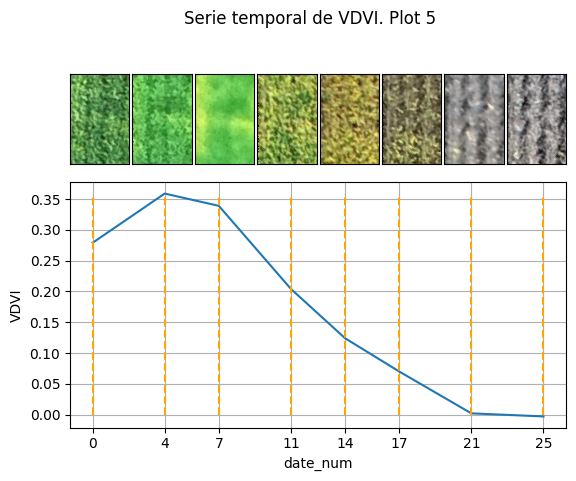

In [110]:
plot_time_series(df, imlist)

In [111]:
df , imlist = extract_time_series_images('D:/isleño_mix/Modificado', r'D:\isleño_mix\Grid_Aoi.geojson', -48,(29,12,100,120), 5)

1/8 : 20240405_Orotmosaico_transparent_mosaic_group1_modificado.tif
Grid Coords system: urn:ogc:def:crs:EPSG::32720
2/8 : 20240401_Ortomosaico_transparent_mosaic_group1_modificado.tif
Grid Coords system: urn:ogc:def:crs:EPSG::32720
3/8 : 20240328_Ortomosaico_transparent_mosaic_group1_modificado.tif
Grid Coords system: urn:ogc:def:crs:EPSG::32720
4/8 : 20240325_Ortomosaico_transparent_mosaic_group1_modificado.tif
Grid Coords system: urn:ogc:def:crs:EPSG::32720
5/8 : 20240322_Ortomosaico_transparent_mosaic_group1_modificado.tif
Grid Coords system: urn:ogc:def:crs:EPSG::32720
6/8 : 20240318_Ortomosaico_transparent_mosaic_group1_modificado.tif
Grid Coords system: urn:ogc:def:crs:EPSG::32720
7/8 : 20240315_Ortomosaico_transparent_mosaic_group1_modificado.tif
Grid Coords system: urn:ogc:def:crs:EPSG::32720
8/8 : 20240311_Ortomosaico_transparent_mosaic_group1.tif
Grid Coords system: urn:ogc:def:crs:EPSG::32720


In [112]:
def eplot_times_series( raster_path, grid_path, angle, crop, plot_id , yrange = (0,0), threshold = 'na'):
    df , imlist = extract_time_series_images(raster_path, grid_path, angle,crop, plot_id)
    plot = plot_time_series(df, imlist, yrange ,threshold)
    return plot

In [113]:
plot10 =  eplot_times_series('D:/isleño_mix/Modificado', r'D:\isleño_mix\Grid_Aoi.geojson', -48,(29,12,100,120), 10
, (-0.01,0.5))

1/8 : 20240405_Orotmosaico_transparent_mosaic_group1_modificado.tif
Grid Coords system: urn:ogc:def:crs:EPSG::32720
2/8 : 20240401_Ortomosaico_transparent_mosaic_group1_modificado.tif
Grid Coords system: urn:ogc:def:crs:EPSG::32720
3/8 : 20240328_Ortomosaico_transparent_mosaic_group1_modificado.tif
Grid Coords system: urn:ogc:def:crs:EPSG::32720
4/8 : 20240325_Ortomosaico_transparent_mosaic_group1_modificado.tif
Grid Coords system: urn:ogc:def:crs:EPSG::32720
5/8 : 20240322_Ortomosaico_transparent_mosaic_group1_modificado.tif
Grid Coords system: urn:ogc:def:crs:EPSG::32720
6/8 : 20240318_Ortomosaico_transparent_mosaic_group1_modificado.tif
Grid Coords system: urn:ogc:def:crs:EPSG::32720
7/8 : 20240315_Ortomosaico_transparent_mosaic_group1_modificado.tif
Grid Coords system: urn:ogc:def:crs:EPSG::32720
8/8 : 20240311_Ortomosaico_transparent_mosaic_group1.tif
Grid Coords system: urn:ogc:def:crs:EPSG::32720


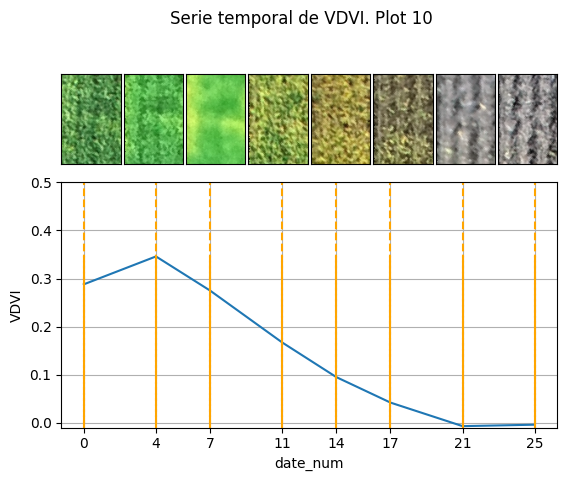

In [115]:
plot10

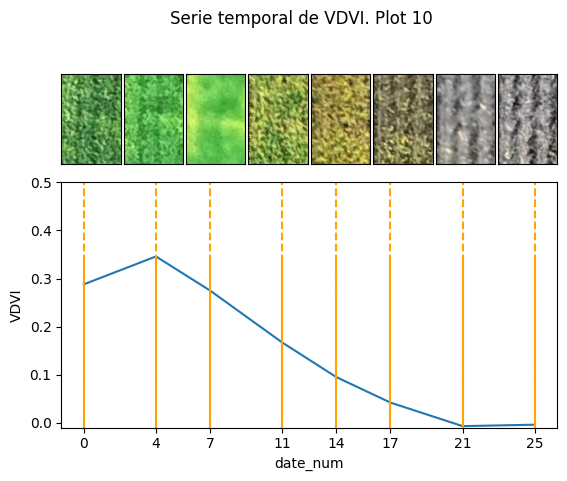

In [108]:
plot10

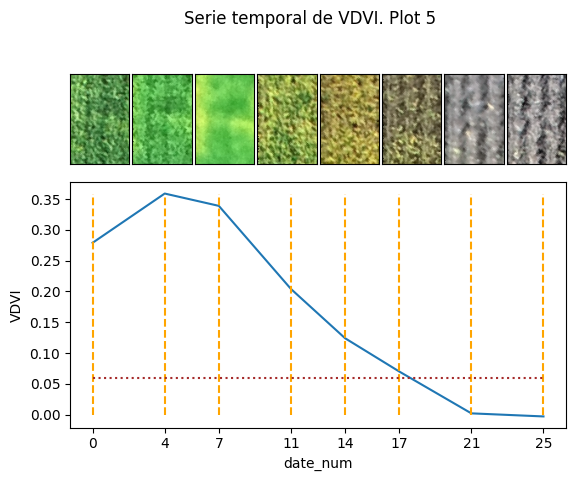

In [38]:
import matplotlib.pyplot as plt


fig = plt.figure()
plt.suptitle(f"Serie temporal de VDVI. Plot {df.fid.values[0]}")

gs = fig.add_gridspec(2,8,height_ratios=[1,2], wspace=0.05, hspace= 0.01)

for impos, imval in enumerate(df.date_num.sort_values()):
    date_in_df = df.loc[df.date_num == imval].Date.values[0]
    ax1 = fig.add_subplot(gs[0,impos])
    plt.imshow(imlist[date_in_df])
    ax1.set_xticks([])
    ax1.set_yticks([])

axbig = fig.add_subplot(gs[1, :])
sns.lineplot(df, x='date_num', y = 'VDVI')
plt.vlines(df.date_num,ymax=df.VDVI.max(), ymin=0, colors= 'orange',linestyles='dashed')
axbig.set_xticks(df.date_num)
plt.hlines(0.060, 0, 25, colors='brown', linestyles='dotted')

plt.show()


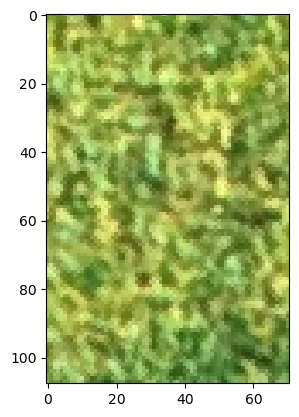

In [160]:
plt.imshow(imlist[0])

c:\Users\fiore\anaconda3\envs\py39\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\fiore\anaconda3\envs\py39\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<AxesSubplot: xlabel='date_num', ylabel='VDVI'>

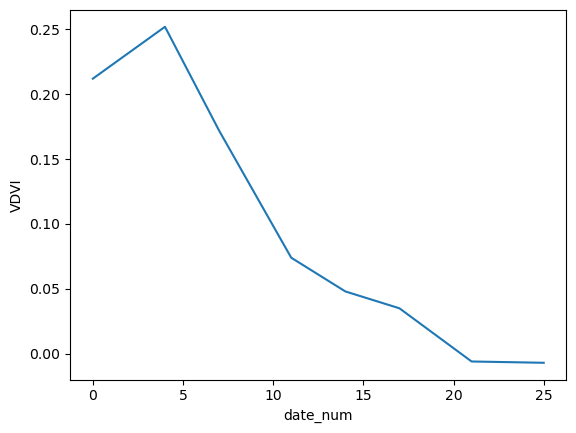

In [124]:
sns.lineplot(df, x='date_num', y = 'VDVI')

In [172]:
values_stack = procces_stack_tiff('F:/isleño_mix/Modificado', r'F:\isleño_mix\Grid_Aoi.geojson', -48,(29,12,100,120) )

1/8 : 20240405_Orotmosaico_transparent_mosaic_group1_modificado.tif
Grids Coords system: urn:ogc:def:crs:EPSG::32720
Raster Coords system: EPSG:32720
2/8 : 20240401_Ortomosaico_transparent_mosaic_group1_modificado.tif
Grids Coords system: urn:ogc:def:crs:EPSG::32720
Raster Coords system: EPSG:32720
3/8 : 20240328_Ortomosaico_transparent_mosaic_group1_modificado.tif
Grids Coords system: urn:ogc:def:crs:EPSG::32720
Raster Coords system: EPSG:32720
4/8 : 20240325_Ortomosaico_transparent_mosaic_group1_modificado.tif
Grids Coords system: urn:ogc:def:crs:EPSG::32720
Raster Coords system: EPSG:32720
5/8 : 20240322_Ortomosaico_transparent_mosaic_group1_modificado.tif
Grids Coords system: urn:ogc:def:crs:EPSG::32720
Raster Coords system: EPSG:32720
6/8 : 20240318_Ortomosaico_transparent_mosaic_group1_modificado.tif
Grids Coords system: urn:ogc:def:crs:EPSG::32720
Raster Coords system: EPSG:32720
7/8 : 20240315_Ortomosaico_transparent_mosaic_group1_modificado.tif
Grids Coords system: urn:ogc:def

In [193]:
values_stack.keys()

dict_keys(['20240405_Orotmosaico_transparent_mosaic_group1_modificado.tif', '20240401_Ortomosaico_transparent_mosaic_group1_modificado.tif', '20240328_Ortomosaico_transparent_mosaic_group1_modificado.tif', '20240325_Ortomosaico_transparent_mosaic_group1_modificado.tif', '20240322_Ortomosaico_transparent_mosaic_group1_modificado.tif', '20240318_Ortomosaico_transparent_mosaic_group1_modificado.tif', '20240315_Ortomosaico_transparent_mosaic_group1_modificado.tif', '20240311_Ortomosaico_transparent_mosaic_group1.tif'])

In [194]:
values_stack['20240311_Ortomosaico_transparent_mosaic_group1.tif']

,fid,Date,VDVI,EGI,CIVE,NDI,VI,NGRDI,GLCM_ASM_Mean,GLCM_Contrast_Mean,...,GLCM_InverseDifferenceMoment_Mean,GLCM_SumAverage_Mean,GLCM_SumVariance_Mean,GLCM_SumEntropy_Mean,GLCM_Entropy_Mean,GLCM_DifferenceVariance_Mean,GLCM_DifferenceEntropy_Mean,GLCM_Information1_Mean,GLCM_Information2_Mean,GLCM_MaximalCorrelationCoefficient_Mean
0,1,20240311,0.244,49.65,-0.42,23.03,1.58,0.17,0.000191,497.806604,...,0.057324,228.209025,3200.949384,7.815423,12.637888,0.000091,5.502962,-0.177244,0.954850,5.029762
1,2,20240311,0.230,50.86,-1.01,25.93,1.56,0.19,0.000167,583.857606,...,0.052750,244.203269,4231.705934,8.020429,12.824430,0.000084,5.617121,-0.202854,0.971323,5.027951
2,3,20240311,0.227,48.98,-0.11,21.64,1.53,0.16,0.000171,565.142700,...,0.056499,238.860859,3888.073061,7.963832,12.777711,0.000087,5.595124,-0.193288,0.965988,5.101441
3,4,20240311,0.239,52.26,-1.36,21.35,1.56,0.16,0.000173,511.824946,...,0.058095,243.685511,4091.052533,8.000549,12.769290,0.000090,5.524185,-0.201548,0.970070,5.240979
4,5,20240311,0.278,60.92,-5.15,32.25,1.73,0.24,0.000190,507.233376,...,0.058536,241.931891,3433.953130,7.877030,12.658955,0.000095,5.513512,-0.188086,0.961902,5.112040
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3595,3596,20240311,0.286,70.34,-9.08,37.68,1.80,0.29,0.000202,501.424577,...,0.057980,269.606332,2718.820876,7.717225,12.573882,0.000096,5.514322,-0.165975,0.945948,4.857644
3596,3597,20240311,0.276,61.33,-5.46,35.76,1.76,0.27,0.000214,432.067956,...,0.062455,243.695186,2661.661328,7.690587,12.481942,0.000104,5.402972,-0.168299,0.946666,4.998524
3597,3598,20240311,0.292,69.58,-8.76,37.63,1.82,0.29,0.000235,418.398711,...,0.060966,262.256068,2071.061629,7.520811,12.357532,0.000106,5.381429,-0.147102,0.924551,4.809124
3598,3599,20240311,0.281,62.82,-6.11,37.73,1.79,0.29,0.000228,433.677387,...,0.062443,246.693822,2351.338154,7.596403,12.407305,0.000103,5.406353,-0.157874,0.936676,4.775701


In [202]:
values_stack2.keys()

dict_keys(['20240405_Orotmosaico_transparent_mosaic_group1_modificado.tif', '20240401_Ortomosaico_transparent_mosaic_group1_modificado.tif', '20240328_Ortomosaico_transparent_mosaic_group1_modificado.tif', '20240325_Ortomosaico_transparent_mosaic_group1_modificado.tif', '20240322_Ortomosaico_transparent_mosaic_group1_modificado.tif', '20240318_Ortomosaico_transparent_mosaic_group1_modificado.tif', '20240315_Ortomosaico_transparent_mosaic_group1_modificado.tif', '20240311_Ortomosaico_transparent_mosaic_group1.tif'])

In [275]:
values_stack2 = values_stack.copy()

In [316]:
def to_wide_format(data, dataframe=True):
    data1 = data.copy()
    overal_cols =['fid','Date']
    for d in data1.keys():
        cols = []
        df = data1[d]
        for c in df.columns:
            if c in ['fid','Date']:
                cols.append(c )
            else:
                overal_cols.append(c + '_' + d.split('_')[0])
                cols.append(c + '_' + d.split('_')[0])
        data1[d] =data1[d].rename(columns=dict(zip(df.columns, cols)))
    
    if dataframe :
       for pos,val in enumerate(data1.values()):
        print(pos)
        if pos == 0:
            dfm =pd.DataFrame(val)
        else:
            dfm = dfm.merge(pd.DataFrame(val).drop(columns='Date'), on = 'fid', how= 'outer')

       return dfm
    else:
        return data1

In [317]:
val_ext_wide = to_wide_format(values_stack2)

0
1
2
3
4
5
6
7


In [287]:
import missingno as msno 

In [318]:
val_ext_wide.head()

,fid,Date,VDVI_20240405,EGI_20240405,CIVE_20240405,NDI_20240405,VI_20240405,NGRDI_20240405,GLCM_ASM_Mean_20240405,GLCM_Contrast_Mean_20240405,...,GLCM_InverseDifferenceMoment_Mean_20240311,GLCM_SumAverage_Mean_20240311,GLCM_SumVariance_Mean_20240311,GLCM_SumEntropy_Mean_20240311,GLCM_Entropy_Mean_20240311,GLCM_DifferenceVariance_Mean_20240311,GLCM_DifferenceEntropy_Mean_20240311,GLCM_Information1_Mean_20240311,GLCM_Information2_Mean_20240311,GLCM_MaximalCorrelationCoefficient_Mean_20240311
0,1,20240405,-0.008,-2.04,20.46,1.89,0.99,0.01,0.000161,561.340022,...,0.057324,228.209025,3200.949384,7.815423,12.637888,0.000091,5.502962,-0.177244,0.954850,5.029762
1,10,20240405,-0.004,-0.96,20.32,-2.51,0.98,-0.03,0.000148,568.455122,...,0.051733,222.759723,3618.811578,7.901063,12.781862,0.000083,5.656022,-0.181833,0.959202,4.886640
2,100,20240405,0.009,2.38,18.86,0.38,1.01,-0.00,0.000173,508.620579,...,0.056965,261.773642,3026.412018,7.793650,12.664152,0.000090,5.562082,-0.171568,0.951262,4.961844
3,1000,20240405,-0.002,-0.43,20.18,-4.77,0.97,-0.05,0.000174,451.934719,...,0.064548,278.287705,3096.214969,7.806163,12.516569,0.000107,5.347970,-0.186447,0.959882,5.232875
4,1001,20240405,-0.003,-0.76,20.34,-3.90,0.97,-0.04,0.000160,484.099551,...,0.061961,280.123973,2274.766004,7.590161,12.426058,0.000101,5.412074,-0.152812,0.931880,4.897764


<AxesSubplot: >

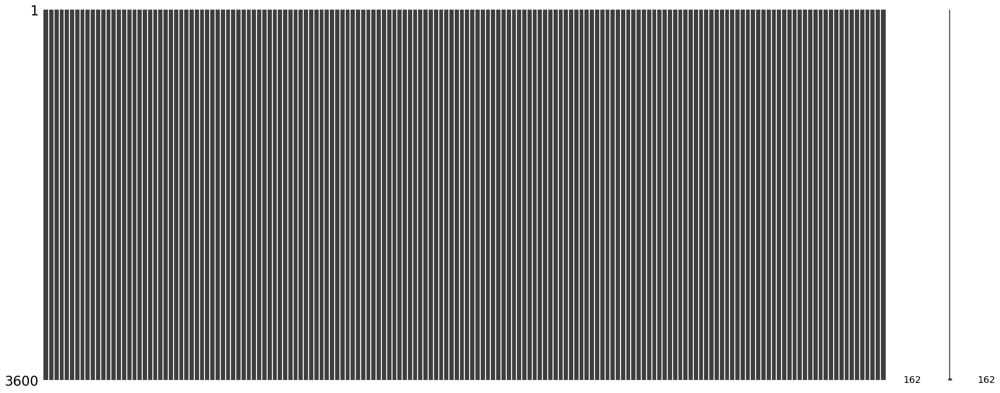

In [319]:
msno.matrix(val_ext_wide) 

In [257]:
val_ext_wide.head()

,0,1,2,3,4,5,6,7,8,9,...,166,167,168,169,170,171,172,173,174,175
0,1,20240405,-0.008,-2.04,20.46,1.89,0.99,0.01,0.000161,561.340022,...,0.057324,228.209025,3200.949384,7.815423,12.637888,0.000091,5.502962,-0.177244,0.954850,5.029762
1,2,20240405,0.001,0.28,19.63,-0.12,1.00,-0.01,0.000164,526.305763,...,0.052750,244.203269,4231.705934,8.020429,12.824430,0.000084,5.617121,-0.202854,0.971323,5.027951
2,3,20240405,-0.005,-1.44,20.27,2.27,1.00,0.01,0.000167,550.693717,...,0.056499,238.860859,3888.073061,7.963832,12.777711,0.000087,5.595124,-0.193288,0.965988,5.101441
3,4,20240405,-0.006,-1.53,20.52,-0.86,0.98,-0.01,0.000153,577.238392,...,0.058095,243.685511,4091.052533,8.000549,12.769290,0.000090,5.524185,-0.201548,0.970070,5.240979
4,5,20240405,-0.003,-0.82,20.16,-0.44,0.99,-0.01,0.000173,488.670543,...,0.058536,241.931891,3433.953130,7.877030,12.658955,0.000095,5.513512,-0.188086,0.961902,5.112040


In [224]:
val_extracted = pd.concat(list(values_stack.values()),axis=0)

In [104]:
val_extracted['Date'] = pd.to_datetime(val_extracted['Date'])

In [105]:
val_extracted.head()

,fid,Date,VDVI,EGI,CIVE,NDI,VI,NGRDI,GLCM_ASM_Mean,GLCM_Contrast_Mean,...,GLCM_InverseDifferenceMoment_Mean,GLCM_SumAverage_Mean,GLCM_SumVariance_Mean,GLCM_SumEntropy_Mean,GLCM_Entropy_Mean,GLCM_DifferenceVariance_Mean,GLCM_DifferenceEntropy_Mean,GLCM_Information1_Mean,GLCM_Information2_Mean,GLCM_MaximalCorrelationCoefficient_Mean
0,1,2024-04-05,-0.008,-2.04,20.46,1.89,0.99,0.01,0.000161,561.340022,...,0.059627,264.643154,6247.579399,8.255203,12.901126,0.000086,5.577245,-0.237623,0.984011,5.200534
1,2,2024-04-05,0.001,0.28,19.63,-0.12,1.00,-0.01,0.000164,526.305763,...,0.063582,251.208578,6630.125621,8.301156,12.900883,0.000090,5.525697,-0.251428,0.987279,5.124590
2,3,2024-04-05,-0.005,-1.44,20.27,2.27,1.00,0.01,0.000167,550.693717,...,0.061497,280.875990,6380.438034,8.254514,12.881365,0.000088,5.559111,-0.241204,0.984869,5.164325
3,4,2024-04-05,-0.006,-1.53,20.52,-0.86,0.98,-0.01,0.000153,577.238392,...,0.060045,289.381904,7271.096362,8.334515,12.972381,0.000084,5.594222,-0.250038,0.987355,5.048484
4,5,2024-04-05,-0.003,-0.82,20.16,-0.44,0.99,-0.01,0.000173,488.670543,...,0.063802,272.857191,5949.923031,8.217219,12.822075,0.000093,5.477248,-0.240795,0.984462,5.184892


In [106]:
val_extracted['fid'] = val_extracted['fid'].astype(int)

In [107]:
val_extracted.columns

Index(['fid', 'Date', 'VDVI', 'EGI', 'CIVE', 'NDI', 'VI', 'NGRDI',
       'GLCM_ASM_Mean', 'GLCM_Contrast_Mean', 'GLCM_Correlation_Mean',
       'GLCM_SumOfSquaresVariance_Mean', 'GLCM_InverseDifferenceMoment_Mean',
       'GLCM_SumAverage_Mean', 'GLCM_SumVariance_Mean', 'GLCM_SumEntropy_Mean',
       'GLCM_Entropy_Mean', 'GLCM_DifferenceVariance_Mean',
       'GLCM_DifferenceEntropy_Mean', 'GLCM_Information1_Mean',
       'GLCM_Information2_Mean', 'GLCM_MaximalCorrelationCoefficient_Mean'],
      dtype='object')

In [73]:

from sklearn import preprocessing


In [108]:
[[val_extracted['VDVI'].values]]

[[array([-0.008,  0.001, -0.005, ...,  0.292,  0.281,  0.248])]]

In [345]:
for c in [ 'VDVI', 'EGI', 'CIVE', 'NDI', 'VI', 'NGRDI']:
    val_extracted[c] = val_extracted[c].apply(lambda x: (x-val_extracted[c].values.min())/(val_extracted[c].values.max()-val_extracted[c].values.min()))

In [110]:
val_extracted['fid'].values

array([   1,    2,    3, ..., 3598, 3599, 3600])

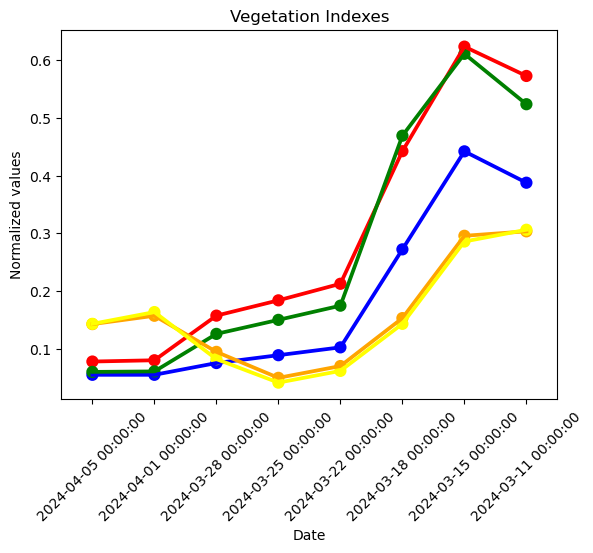

In [130]:
plot =8
sns.pointplot(val_extracted.loc[val_extracted.fid == plot], x='Date', y='VI', color='blue')
sns.pointplot(val_extracted.loc[val_extracted.fid == plot], x='Date', y='VDVI', color='red')
sns.pointplot(val_extracted.loc[val_extracted.fid == plot], x='Date', y='EGI', color='green')
sns.pointplot(val_extracted.loc[val_extracted.fid == plot], x='Date', y='NDI', color='orange')
sns.pointplot(val_extracted.loc[val_extracted.fid == plot], x='Date', y='NGRDI', color='yellow')
plt.xticks(rotation = (45))
plt.title('Vegetation Indexes')
plt.ylabel('Normalized values')
plt.show()

In [113]:
for c in [ 'GLCM_ASM_Mean', 'GLCM_Contrast_Mean', 'GLCM_Correlation_Mean',
       'GLCM_SumOfSquaresVariance_Mean', 'GLCM_InverseDifferenceMoment_Mean',
       'GLCM_SumAverage_Mean', 'GLCM_SumVariance_Mean', 'GLCM_SumEntropy_Mean',
       'GLCM_Entropy_Mean', 'GLCM_DifferenceVariance_Mean',
       'GLCM_DifferenceEntropy_Mean', 'GLCM_Information1_Mean',
       'GLCM_Information2_Mean', 'GLCM_MaximalCorrelationCoefficient_Mean']:
    val_extracted[c] = val_extracted[c].apply(lambda x: (x-val_extracted[c].values.min())/(val_extracted[c].values.max()-val_extracted[c].values.min()))

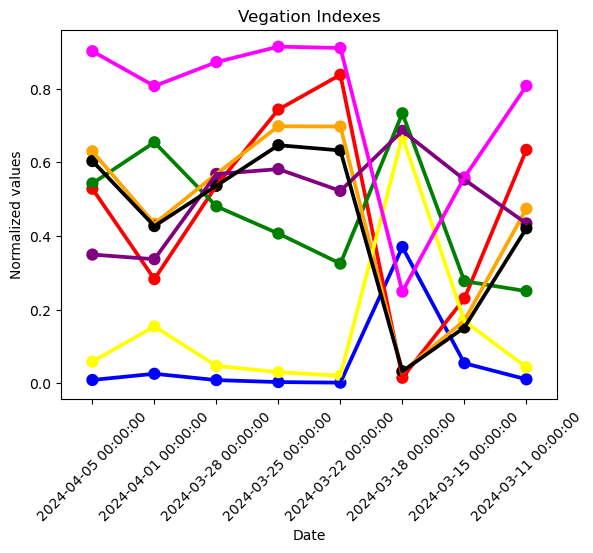

In [117]:
plot = 3018
sns.pointplot(val_extracted.loc[val_extracted.fid == plot], x='Date', y='GLCM_ASM_Mean', color='blue')
sns.pointplot(val_extracted.loc[val_extracted.fid == plot], x='Date', y='GLCM_Contrast_Mean', color='red')
sns.pointplot(val_extracted.loc[val_extracted.fid == plot], x='Date', y='GLCM_Correlation_Mean', color='green')
sns.pointplot(val_extracted.loc[val_extracted.fid == plot], x='Date', y='GLCM_SumOfSquaresVariance_Mean', color='orange')
sns.pointplot(val_extracted.loc[val_extracted.fid == plot], x='Date', y='GLCM_InverseDifferenceMoment_Mean', color='yellow')
sns.pointplot(val_extracted.loc[val_extracted.fid == plot], x='Date', y='GLCM_SumAverage_Mean', color='purple')
sns.pointplot(val_extracted.loc[val_extracted.fid == plot], x='Date', y='GLCM_SumVariance_Mean', color='black')
sns.pointplot(val_extracted.loc[val_extracted.fid == plot], x='Date', y='GLCM_SumEntropy_Mean', color='magenta')
plt.xticks(rotation = (45))
plt.title('Vegation Indexes')
plt.ylabel('Normalized values')
plt.show()

c:\Users\fiore\anaconda3\envs\py39\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\fiore\anaconda3\envs\py39\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\fiore\anaconda3\envs\py39\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\fiore\anaconda3\envs\py39\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 l

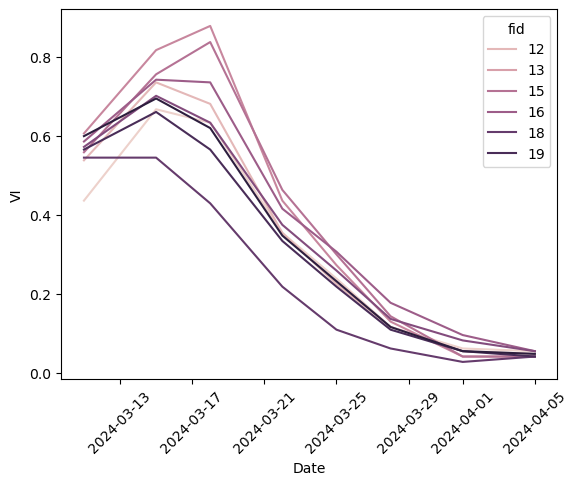

In [136]:
sns.lineplot(val_extracted.loc[val_extracted.fid.isin([11,12,14,15,16,17,18,19,20])], x='Date', y='VI', hue='fid')
plt.xticks(rotation = 45)
plt.show()

In [334]:
from sklearn.cluster import KMeans
from scipy.spatial import distance as cdist

In [247]:
val_ext_wide

,0,1,2,3,4,5,6,7,8,9,...,166,167,168,169,170,171,172,173,174,175
0,1,20240405,-0.008,-2.04,20.46,1.89,0.99,0.01,0.000161,561.340022,...,0.057324,228.209025,3200.949384,7.815423,12.637888,0.000091,5.502962,-0.177244,0.954850,5.029762
1,2,20240405,0.001,0.28,19.63,-0.12,1.00,-0.01,0.000164,526.305763,...,0.052750,244.203269,4231.705934,8.020429,12.824430,0.000084,5.617121,-0.202854,0.971323,5.027951
2,3,20240405,-0.005,-1.44,20.27,2.27,1.00,0.01,0.000167,550.693717,...,0.056499,238.860859,3888.073061,7.963832,12.777711,0.000087,5.595124,-0.193288,0.965988,5.101441
3,4,20240405,-0.006,-1.53,20.52,-0.86,0.98,-0.01,0.000153,577.238392,...,0.058095,243.685511,4091.052533,8.000549,12.769290,0.000090,5.524185,-0.201548,0.970070,5.240979
4,5,20240405,-0.003,-0.82,20.16,-0.44,0.99,-0.01,0.000173,488.670543,...,0.058536,241.931891,3433.953130,7.877030,12.658955,0.000095,5.513512,-0.188086,0.961902,5.112040
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3595,3596,20240405,0.006,1.46,19.52,-4.24,0.98,-0.04,0.000180,420.715846,...,0.057980,269.606332,2718.820876,7.717225,12.573882,0.000096,5.514322,-0.165975,0.945948,4.857644
3596,3597,20240405,0.024,6.38,17.72,-4.82,1.01,-0.05,0.000189,437.297252,...,0.062455,243.695186,2661.661328,7.690587,12.481942,0.000104,5.402972,-0.168299,0.946666,4.998524
3597,3598,20240405,0.029,7.70,17.18,-4.41,1.02,-0.04,0.000187,386.861902,...,0.060966,262.256068,2071.061629,7.520811,12.357532,0.000106,5.381429,-0.147102,0.924551,4.809124
3598,3599,20240405,-0.007,-1.62,20.76,-6.32,0.96,-0.06,0.000189,341.711641,...,0.062443,246.693822,2351.338154,7.596403,12.407305,0.000103,5.406353,-0.157874,0.936676,4.775701


In [246]:
val_ext_wide.iloc[:,2:].columns

RangeIndex(start=2, stop=176, step=1)

In [322]:
## Normalizamos los valores
for c in val_ext_wide.iloc[:,2:].columns:
    val_ext_wide[c] = val_ext_wide[c].apply(lambda x: (x-val_ext_wide[c].values.min())/(val_ext_wide[c].values.max()-val_ext_wide[c].values.min()))

In [328]:
val_ext_wide.iloc[:,2:].values

array([[0.11764706, 0.13732259, 0.85181776, ..., 0.68632694, 0.56755378,
        0.73491348],
       [0.13235294, 0.15803606, 0.84537506, ..., 0.65371049, 0.61891894,
        0.62702047],
       [0.18014706, 0.22209436, 0.77818684, ..., 0.72667739, 0.52520214,
        0.68371315],
       ...,
       [0.16176471, 0.19716149, 0.81362172, ..., 0.6629891 , 0.57733847,
        0.93248641],
       [0.13235294, 0.15746068, 0.8495168 , ..., 0.64143556, 0.59785846,
        0.85875684],
       [0.11764706, 0.13310318, 0.87390704, ..., 0.60097188, 0.63521398,
        0.9458877 ]])

Text(0.5, 1.0, 'Elbow curve')

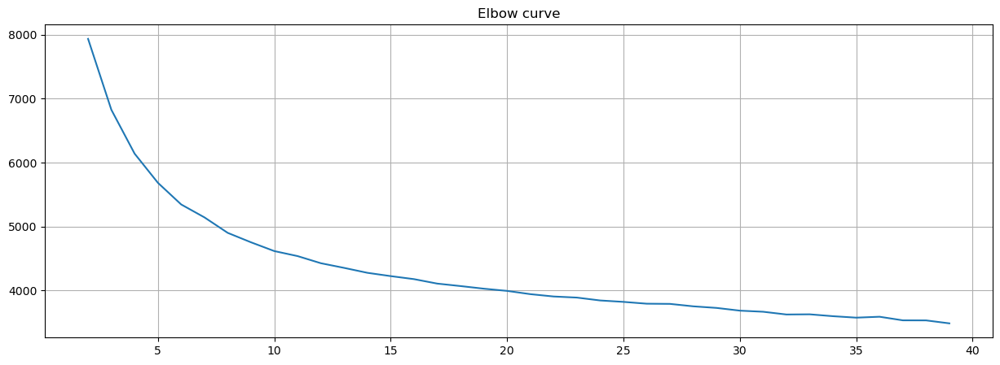

In [343]:
## With all the variables 
X = val_ext_wide.iloc[:,2:].values

distorsions = []
for k in range(2, 40):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    distorsions.append(kmeans.inertia_)

fig = plt.figure(figsize=(15, 5))
plt.plot(range(2, 40), distorsions)
plt.grid(True)
plt.title('Elbow curve')

In [ ]:
## Lets see with only the vegetatio index 

In [348]:
vidf = val_extracted.pivot_table(values = [ 'VDVI', 'EGI', 'CIVE', 'NDI', 'VI', 'NGRDI'], index = 'fid').reset_index()

Text(0.5, 1.0, 'Elbow curve')

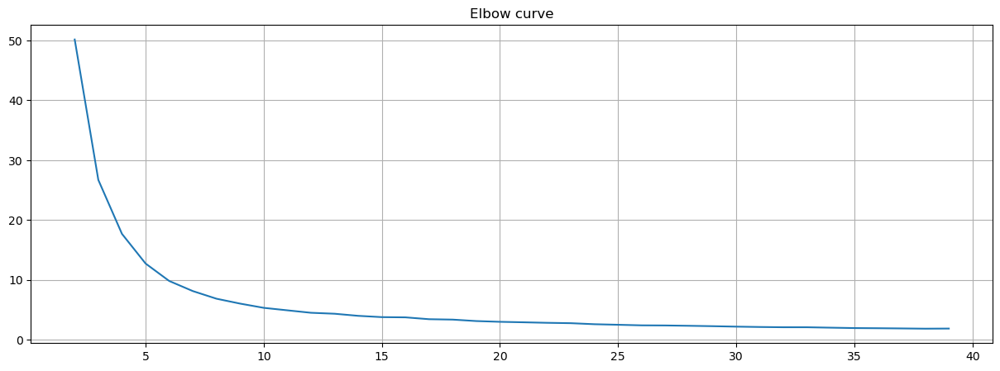

In [349]:
X = vidf.iloc[:,1:].values

distorsions = []
for k in range(2, 40):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    distorsions.append(kmeans.inertia_)

fig = plt.figure(figsize=(15, 5))
plt.plot(range(2, 40), distorsions)
plt.grid(True)
plt.title('Elbow curve')

In [425]:
X = vidf.iloc[:,1:].values
kmeans = KMeans(n_clusters=15)
kmeans.fit(X)
predicted  = kmeans.predict(X)

In [426]:
vidf['groups'] = predicted

In [427]:
gval_ex = val_extracted.merge(vidf.loc[:,['fid','groups']], on = 'fid', how='outer')

In [428]:
gval_ex

,fid,Date,VDVI,EGI,CIVE,NDI,VI,NGRDI,GLCM_ASM_Mean,GLCM_Contrast_Mean,...,GLCM_SumAverage_Mean,GLCM_SumVariance_Mean,GLCM_SumEntropy_Mean,GLCM_Entropy_Mean,GLCM_DifferenceVariance_Mean,GLCM_DifferenceEntropy_Mean,GLCM_Information1_Mean,GLCM_Information2_Mean,GLCM_MaximalCorrelationCoefficient_Mean,groups
0,1,20240405,0.070796,0.054929,0.939644,0.179556,0.054422,0.183673,0.000161,561.340022,...,264.643154,6247.579399,8.255203,12.901126,0.000086,5.577245,-0.237623,0.984011,5.200534,11
1,1,20240401,0.073009,0.055619,0.938519,0.207434,0.068027,0.204082,0.000272,221.106603,...,283.630325,4114.537777,7.963998,12.259970,0.000152,4.904563,-0.250793,0.984106,5.107937,11
2,1,20240328,0.163717,0.127503,0.871415,0.151992,0.088435,0.142857,0.000182,540.975756,...,232.716272,4287.313132,8.031232,12.761175,0.000091,5.542020,-0.206572,0.972275,5.290358,11
3,1,20240325,0.212389,0.183122,0.828679,0.074500,0.102041,0.061224,0.000170,524.472139,...,284.727911,4502.386969,8.052157,12.811899,0.000090,5.532965,-0.208042,0.973390,5.260536,11
4,1,20240322,0.318584,0.294822,0.720525,0.147582,0.176871,0.142857,0.000145,649.707140,...,308.635849,5128.857336,8.143690,13.009741,0.000077,5.690898,-0.204656,0.973179,5.142484,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28795,999,20240325,0.179204,0.147449,0.864480,0.015593,0.081633,0.020408,0.000178,388.049971,...,268.217250,4826.411785,8.103265,12.737360,0.000109,5.325173,-0.225137,0.979293,5.341403,6
28796,999,20240322,0.272124,0.237668,0.777132,0.087100,0.142857,0.081633,0.000223,294.676523,...,289.787209,3326.264942,7.857566,12.446762,0.000123,5.136373,-0.204370,0.969008,5.368749,6
28797,999,20240318,0.524336,0.579440,0.452671,0.216885,0.346939,0.224490,0.001033,33.794239,...,387.051027,1046.401058,7.001528,10.385811,0.000392,3.626717,-0.278427,0.981230,4.078507,6
28798,999,20240315,0.723451,0.682777,0.334583,0.447472,0.537415,0.448980,0.000297,256.116010,...,319.766113,2022.169898,7.505820,12.066955,0.000144,5.030379,-0.172541,0.945219,5.122395,6


In [429]:
gval_ex.columns

Index(['fid', 'Date', 'VDVI', 'EGI', 'CIVE', 'NDI', 'VI', 'NGRDI',
       'GLCM_ASM_Mean', 'GLCM_Contrast_Mean', 'GLCM_Correlation_Mean',
       'GLCM_SumOfSquaresVariance_Mean', 'GLCM_InverseDifferenceMoment_Mean',
       'GLCM_SumAverage_Mean', 'GLCM_SumVariance_Mean', 'GLCM_SumEntropy_Mean',
       'GLCM_Entropy_Mean', 'GLCM_DifferenceVariance_Mean',
       'GLCM_DifferenceEntropy_Mean', 'GLCM_Information1_Mean',
       'GLCM_Information2_Mean', 'GLCM_MaximalCorrelationCoefficient_Mean',
       'groups'],
      dtype='object')

In [430]:
gval_ex.fid = gval_ex.fid.astype(int)

c:\Users\fiore\anaconda3\envs\py39\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\fiore\anaconda3\envs\py39\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\fiore\anaconda3\envs\py39\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\fiore\anaconda3\envs\py39\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 l

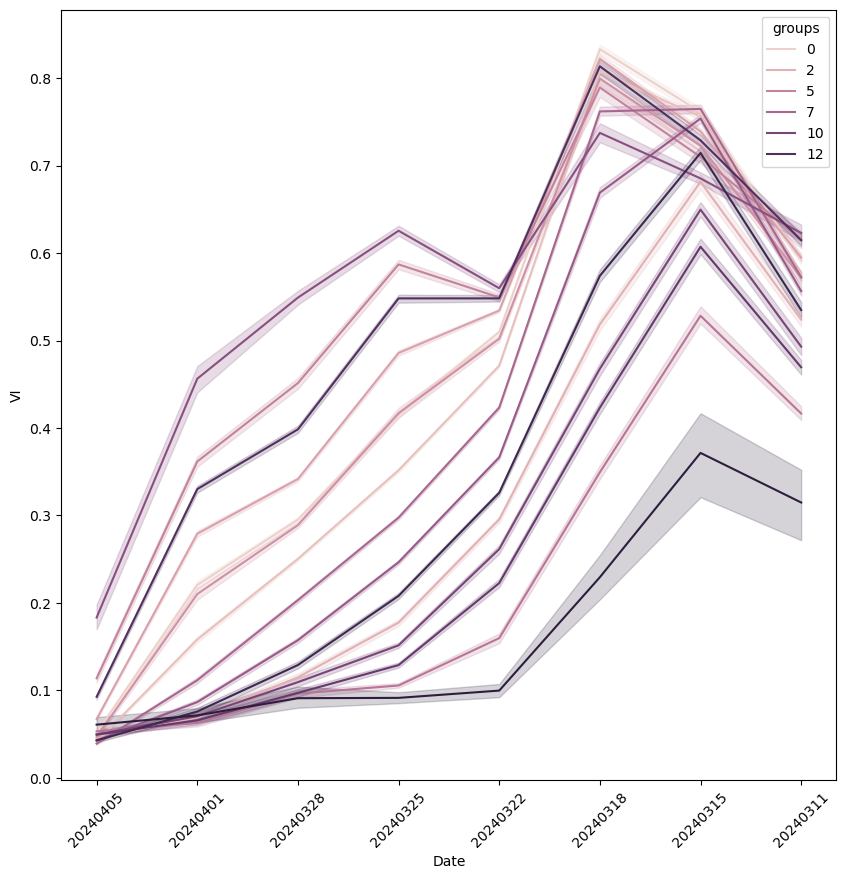

In [431]:
plt.figure(figsize=(10,10))
sns.lineplot(gval_ex, x='Date', y='VI', hue='groups')
plt.xticks(rotation = 45)
plt.show()

In [432]:
gval_ex.groups.value_counts()

groups
1     4824
3     4552
7     3592
8     3136
0     2952
12    1624
4     1504
13    1128
9     1056
5     1048
2     1032
6      776
10     768
11     664
14     144
Name: count, dtype: int64

In [435]:
#val_extracted.to_csv(r'F:\isleño_mix\values_islenio_values.csv', index = False)

In [4]:
df = pd.read_csv(r'F:\isleño_mix\values_islenio_values.csv')

In [5]:
df

,fid,Date,VDVI,EGI,CIVE,NDI,VI,NGRDI,GLCM_ASM_Mean,GLCM_Contrast_Mean,...,GLCM_InverseDifferenceMoment_Mean,GLCM_SumAverage_Mean,GLCM_SumVariance_Mean,GLCM_SumEntropy_Mean,GLCM_Entropy_Mean,GLCM_DifferenceVariance_Mean,GLCM_DifferenceEntropy_Mean,GLCM_Information1_Mean,GLCM_Information2_Mean,GLCM_MaximalCorrelationCoefficient_Mean
0,1,20240405,0.070796,0.054929,0.939644,0.179556,0.054422,0.183673,0.000161,561.340022,...,0.059627,264.643154,6247.579399,8.255203,12.901126,0.000086,5.577245,-0.237623,0.984011,5.200534
1,2,20240405,0.090708,0.072727,0.924086,0.147897,0.061224,0.142857,0.000164,526.305763,...,0.063582,251.208578,6630.125621,8.301156,12.900883,0.000090,5.525697,-0.251428,0.987279,5.124590
2,3,20240405,0.077434,0.059532,0.936082,0.185541,0.061224,0.183673,0.000167,550.693717,...,0.061497,280.875990,6380.438034,8.254514,12.881365,0.000088,5.559111,-0.241204,0.984869,5.164325
3,4,20240405,0.075221,0.058842,0.940769,0.136242,0.047619,0.142857,0.000153,577.238392,...,0.060045,289.381904,7271.096362,8.334515,12.972381,0.000084,5.594222,-0.250038,0.987355,5.048484
4,5,20240405,0.081858,0.064288,0.934021,0.142857,0.054422,0.142857,0.000173,488.670543,...,0.063802,272.857191,5949.923031,8.217219,12.822075,0.000093,5.477248,-0.240795,0.984462,5.184892
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28795,3596,20240311,0.721239,0.610203,0.385942,0.743267,0.605442,0.755102,0.000202,501.424577,...,0.057980,269.606332,2718.820876,7.717225,12.573882,0.000096,5.514322,-0.165975,0.945948,4.857644
28796,3597,20240311,0.699115,0.541082,0.453796,0.713026,0.578231,0.714286,0.000214,432.067956,...,0.062455,243.695186,2661.661328,7.690587,12.481942,0.000104,5.402972,-0.168299,0.946666,4.998524
28797,3598,20240311,0.734513,0.604373,0.391940,0.742479,0.619048,0.755102,0.000235,418.398711,...,0.060966,262.256068,2071.061629,7.520811,12.357532,0.000106,5.381429,-0.147102,0.924551,4.809124
28798,3599,20240311,0.710177,0.552512,0.441612,0.744054,0.598639,0.755102,0.000228,433.677387,...,0.062443,246.693822,2351.338154,7.596403,12.407305,0.000103,5.406353,-0.157874,0.936676,4.775701


In [6]:
grid = df.loc[:,['fid','VDVI']].copy().groupby('fid').agg({"VDVI":'mean'}).reset_index()
grid

,fid,VDVI
0,1,0.357024
1,2,0.435011
2,3,0.355918
3,4,0.361173
4,5,0.467091
...,...,...
3595,3596,0.576327
3596,3597,0.592920
3597,3598,0.615044
3598,3599,0.565819


In [ ]:
n_entr = 10
n_range = 40
n_fr = int(36/4)
n_plots= 3600

frente = n_fr * n_entr
n_plots/frente  ## Numero de total de entradas de frente tiene que ser igual al numero de tablones
rang = np.array(range(1,(n_plots+frente),(frente))) # Todos quedan con +1 ya que range no tiene en cuenta el utlimo valor 

tab_list = []
for pos,val in enumerate(rang):
    if pos != 0 :
        tab_list.append(np.array(range(rang[(pos-1)],rang[pos])))
        print(np.array(range(rang[(pos-1)],rang[pos])))
    else:
        print(pos )

In [8]:
tab_dic = dict(zip(np.array(range(1,len(tab_list)+1)).astype(str), tab_list))

### Funcion para convertir grilla a grilla gdm 

In [10]:
def Grid_to_gdm(grilla_fid, df,col_franja, col_entry, col_range):

    n_entr = df[col_entry].max()
    n_range = df[col_range].max()
    n_plots = df.shape[0]
 
    if (int((n_plots/n_range)/n_entr) != df[col_franja].max()):
          print('El numero total de Franjas no es correcto!\nSe procede a sintetizar las franjas nuevas')
    
    frente = int(n_plots/n_range) ## Numero de total de entradas de frente tiene que ser igual al numero de tablones
    entr = np.array(range(1, frente + n_entr, n_entr)) ## Genera las primeras entradas
    
    ent_list = []
    ## Genera la primera fila de entradas a partir de esta lista de las primeras entradas se calcula todo
    for pos,val in enumerate(entr):
        if pos != 0 :
            ent_list.append(np.array(range(entr[(pos-1)],entr[pos])))

    grid = grilla_fid.copy()
    grid['Franja'] = 0
    grid['Range'] = 0
    grid['Entry'] = 0
    for fr,val in enumerate(ent_list): ## hace un loop por cada elemento de la primera franja de entradas
        for r in np.array(range(0,n_range)): ## hace un loop y suma el totoal de plots id de frente
            grid.loc[grid.fid.isin(ent_list[fr]+(frente* r)), 'Franja'] = fr+1
            grid.loc[grid.fid.isin(ent_list[fr]+(frente* r)), 'Range'] = r+1
            for epos,eval in enumerate(ent_list[fr]):
                        grid.loc[grid.fid.isin([ent_list[fr][epos]+(frente* r)]),'Entry'] = epos+1
    grid['clave'] = grid['Franja'].astype(str)+ '_' + grid['Range'].astype(str) + '_' + grid['Entry'].astype(str)
    return grid

In [11]:
grid = df.loc[:,['fid','VDVI']].copy().groupby('fid').agg({"VDVI":'mean'}).reset_index()
grid.head()

,fid,VDVI
0,1,0.357024
1,2,0.435011
2,3,0.355918
3,4,0.361173
4,5,0.467091


In [13]:
dfgdm = pd.read_excel(r'F:\isleño_mix\Testing 2_PRYT_1101_1136_CORONEL_ISLENIO.xlsx',
                      sheet_name='DETAIL_1',header =1 )

c:\Users\fiore\anaconda3\envs\py39\lib\site-packages\openpyxl\worksheet\_read_only.py:81: UserWarning: Data Validation extension is not supported and will be removed
  for idx, row in parser.parse():


In [14]:
dfgdmres = dfgdm.iloc[:,:9].copy()

In [15]:
dfgdm.head(1)

,Id,ENS,NRO,FRANJA,TRAT,ENT,TAB,PLOT,REP,VARIEDAD,...,SIM_MOL,SYHT0H2_AP,SYHT0H2_ZG,Vip3Aa_DBN,GGT_S4003_14_ZG,GGT_S4003_14_AP,GIR_S4006_3_ZG,GIR_S4006_3_AP,M_INC_QTL10,M_INC_QTL18
0,ce206875-4755-4a90-bc6e-b09f01701481,PRYT,1101,1,1,1,1,1,1,DM33R22,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
gdmdf = Grid_to_gdm(grid,dfgdmres,'FRANJA', 'ENT','TAB')

In [17]:
gdmdf

,fid,VDVI,Franja,Range,Entry,clave
0,1,0.357024,1,1,1,1_1_1
1,2,0.435011,1,1,2,1_1_2
2,3,0.355918,1,1,3,1_1_3
3,4,0.361173,1,1,4,1_1_4
4,5,0.467091,1,1,5,1_1_5
...,...,...,...,...,...,...
3595,3596,0.576327,9,40,6,9_40_6
3596,3597,0.592920,9,40,7,9_40_7
3597,3598,0.615044,9,40,8,9_40_8
3598,3599,0.565819,9,40,9,9_40_9


In [19]:
dfgdmres['clave'] = dfgdmres['FRANJA'].astype(str)+ '_' + dfgdmres['TAB'].astype(str) + '_' + dfgdmres['ENT'].astype(str)

In [20]:
gdmdf.merge(dfgdmres, how='outer', on='clave')

,fid,VDVI,Franja,Range,Entry,clave,Id,ENS,NRO,FRANJA,TRAT,ENT,TAB,PLOT,REP
0,811,0.346239,1,10,1,1_10_1,b4506a49-0199-4a9b-850e-b09f01701482,PRYT,1101,1,49,1,10,91,2
1,820,0.365597,1,10,10,1_10_10,0acd0085-b0a9-47a2-8d72-b09f01701482,PRYT,1101,1,27,10,10,100,2
2,812,0.384126,1,10,2,1_10_2,efc1af32-5a4f-429a-ab59-b09f01701482,PRYT,1101,1,21,2,10,92,2
3,813,0.410675,1,10,3,1_10_3,5bf2b74a-c945-4394-a230-b09f01701482,PRYT,1101,1,2,3,10,93,2
4,814,0.317201,1,10,4,1_10_4,86e8fccd-c1b9-4c26-9079-b09f01701482,PRYT,1101,1,19,4,10,94,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3595,805,0.591538,9,9,5,9_9_5,9e022878-8a34-45ca-9fe6-b09f01706a46,PRYT,1133,9,41,5,9,85,2
3596,806,0.602323,9,9,6,9_9_6,ef353153-5f0a-454b-aabe-b09f01706a46,PRYT,1133,9,15,6,9,86,2
3597,807,0.624170,9,9,7,9_9_7,565837ec-46e7-4e94-b25f-b09f01706a46,PRYT,1133,9,32,7,9,87,2
3598,808,0.609790,9,9,8,9_9_8,e4b57591-af6c-4f94-ab50-b09f01706a46,PRYT,1133,9,28,8,9,88,2


In [139]:
#grid.to_csv(r'D:\isleño_mix\GDM_GRID_data.csv', index = False)

### Funcion para converti gilla a grilla Eiwa

In [123]:
def Grid_to_eiwa(grilla_fid, df,col_franja, col_entry, col_range):

    n_entr = df[col_entry].max()
    n_range = df[col_range].max()
    n_plots = df.shape[0]
 
    if (int((n_plots/n_range)/n_entr) != df[col_franja].max()):
          print('El numero total de Franjas no es correcto!\nSe procede a sintetizar las franjas nuevas')
    
    frente = int(n_plots/n_range) ## Numero de total de entradas de frente tiene que ser igual al numero de tablones
    print(frente)
    entr = np.array(range(1, df.shape[0]+frente+1, frente)) ## Genera las primeras entradas
 
    ent_list = []
    ## Genera la primera fila de entradas a partir de esta lista de las primeras entradas se calcula todo
    for pos,val in enumerate(entr):
        if pos != 0 :
            ent_list.append(np.array(range(entr[(pos-1)],entr[pos])))
  

    grid = grilla_fid.copy()

    grid['EW_Range'] = 0
    grid['EW_Entry'] = 0
    for rang,rval in enumerate(ent_list): ## hace un loop por cada elemento de la primera franja de entradas
            grid.loc[grid.fid.isin(ent_list[rang]), 'EW_Range'] = rang + 1

            for pent,vent in enumerate(rval):
                grid.loc[grid.fid == vent, 'EW_Entry'] = pent + 1
                
    grid['EW_clave'] = grid['EW_Range'].astype(str) + '_' + grid['EW_Entry'].astype(str)
    return grid

In [140]:
eig = Grid_to_eiwa(df,dfgdmres,'FRANJA', 'ENT','TAB')

90


In [141]:
eig

,fid,Date,VDVI,EGI,CIVE,NDI,VI,NGRDI,GLCM_ASM_Mean,GLCM_Contrast_Mean,...,GLCM_SumEntropy_Mean,GLCM_Entropy_Mean,GLCM_DifferenceVariance_Mean,GLCM_DifferenceEntropy_Mean,GLCM_Information1_Mean,GLCM_Information2_Mean,GLCM_MaximalCorrelationCoefficient_Mean,EW_Range,EW_Entry,EW_clave
0,1,20240405,0.070796,0.054929,0.939644,0.179556,0.054422,0.183673,0.000161,561.340022,...,8.255203,12.901126,0.000086,5.577245,-0.237623,0.984011,5.200534,1,1,1_1
1,2,20240405,0.090708,0.072727,0.924086,0.147897,0.061224,0.142857,0.000164,526.305763,...,8.301156,12.900883,0.000090,5.525697,-0.251428,0.987279,5.124590,1,2,1_2
2,3,20240405,0.077434,0.059532,0.936082,0.185541,0.061224,0.183673,0.000167,550.693717,...,8.254514,12.881365,0.000088,5.559111,-0.241204,0.984869,5.164325,1,3,1_3
3,4,20240405,0.075221,0.058842,0.940769,0.136242,0.047619,0.142857,0.000153,577.238392,...,8.334515,12.972381,0.000084,5.594222,-0.250038,0.987355,5.048484,1,4,1_4
4,5,20240405,0.081858,0.064288,0.934021,0.142857,0.054422,0.142857,0.000173,488.670543,...,8.217219,12.822075,0.000093,5.477248,-0.240795,0.984462,5.184892,1,5,1_5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28795,3596,20240311,0.721239,0.610203,0.385942,0.743267,0.605442,0.755102,0.000202,501.424577,...,7.717225,12.573882,0.000096,5.514322,-0.165975,0.945948,4.857644,40,86,40_86
28796,3597,20240311,0.699115,0.541082,0.453796,0.713026,0.578231,0.714286,0.000214,432.067956,...,7.690587,12.481942,0.000104,5.402972,-0.168299,0.946666,4.998524,40,87,40_87
28797,3598,20240311,0.734513,0.604373,0.391940,0.742479,0.619048,0.755102,0.000235,418.398711,...,7.520811,12.357532,0.000106,5.381429,-0.147102,0.924551,4.809124,40,88,40_88
28798,3599,20240311,0.710177,0.552512,0.441612,0.744054,0.598639,0.755102,0.000228,433.677387,...,7.596403,12.407305,0.000103,5.406353,-0.157874,0.936676,4.775701,40,89,40_89


In [143]:
eiw = pd.read_csv(r'F:\isleño_mix\islenio_data_eiw.csv')
eiw.head()

,Entry,Range,RM_Date_eiwa,RM State
0,1,1,3/28/2024,NaN
1,2,1,4/1/2024,NaN
2,3,1,3/29/2024,NaN
3,4,1,3/29/2024,NaN
4,5,1,4/1/2024,NaN


In [144]:
eiw.RM_Date_eiwa = pd.to_datetime(eiw.RM_Date_eiwa)

In [145]:
eiw['eiw_Mdays'] = eiw.RM_Date_eiwa - pd.to_datetime('20240311')

In [146]:
eiw['eiw_Mdaysin'] = np.array(eiw.eiw_Mdays.dt.days)

In [147]:
eiw.RM_Date_eiwa.value_counts(dropna=False)

RM_Date_eiwa
2024-04-06    805
2024-04-05    704
2024-04-02    467
2024-04-01    387
2024-04-08    254
2024-03-29    192
2024-03-28    134
2024-03-31    102
2024-04-07     76
2024-04-03     74
2024-04-09     72
2024-04-04     43
2024-03-26     33
2024-03-30     30
2024-04-10     28
2024-04-11     28
2024-03-25     22
2024-04-18     21
2024-03-23     20
2024-04-12     19
2024-04-14     19
2024-03-24     14
2024-03-27     14
2024-04-13     14
2024-04-15     12
2024-04-16      7
2024-04-17      3
2024-03-22      2
NaT             2
2024-03-21      1
2024-03-20      1
Name: count, dtype: int64

In [131]:
eiw.eiw_Mdaysin.value_counts(dropna=False)

eiw_Mdaysin
26.0    805
25.0    704
22.0    467
21.0    387
28.0    254
18.0    192
17.0    134
20.0    102
27.0     76
23.0     74
29.0     72
24.0     43
15.0     33
19.0     30
30.0     28
31.0     28
14.0     22
38.0     21
12.0     20
32.0     19
34.0     19
13.0     14
16.0     14
33.0     14
35.0     12
36.0      7
37.0      3
11.0      2
NaN       2
10.0      1
9.0       1
Name: count, dtype: int64

In [148]:
eiw['EW_clave'] = eiw.Range.astype(str) + '_' + eiw.Entry.astype(str)

In [149]:
mew = eig.merge(eiw, how='outer', on ='EW_clave')

In [152]:
mew.shape

(28800, 31)

In [153]:
dfgdm

,Id,ENS,NRO,FRANJA,TRAT,ENT,TAB,PLOT,REP,VARIEDAD,...,SIM_MOL,SYHT0H2_AP,SYHT0H2_ZG,Vip3Aa_DBN,GGT_S4003_14_ZG,GGT_S4003_14_AP,GIR_S4006_3_ZG,GIR_S4006_3_AP,M_INC_QTL10,M_INC_QTL18
0,ce206875-4755-4a90-bc6e-b09f01701481,PRYT,1101,1,1,1,1,1,1,DM33R22,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,f6d24b91-2834-442c-8f43-b09f01701481,PRYT,1101,1,2,2,1,2,1,STINE 33EA52 STS,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,178f66a6-693f-4715-b40f-b09f01701481,PRYT,1101,1,3,3,1,3,1,DM33E22STS,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,71482dfb-2857-4a00-88c4-b09f01701481,PRYT,1101,1,4,4,1,4,1,NEO 35S23 SE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,31cf325c-6b95-456b-a2e5-b09f01701481,PRYT,1101,1,5,5,1,5,1,DM38E21STS,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3595,d05ee96b-d503-4f29-8fad-b09f01707389,PRYT,1136,9,26,5,40,395,2,CE22CH0009997,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3596,f0389330-a868-40ed-a7ff-b09f01707389,PRYT,1136,9,48,4,40,394,2,CE22CH0009627,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3597,86f0df5d-5394-49ae-b327-b09f01707389,PRYT,1136,9,20,3,40,393,2,CE22CH0009892,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3598,d5c8047b-8835-4d67-9137-b09f01707389,PRYT,1136,9,7,2,40,392,2,A20CH0229173-CH2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [156]:
gdmdf1 = Grid_to_gdm(mew,dfgdmres,'FRANJA', 'ENT','TAB')

In [158]:
gdmdf1.sample(5)

,fid,Date,VDVI,EGI,CIVE,NDI,VI,NGRDI,GLCM_ASM_Mean,GLCM_Contrast_Mean,...,EW_Entry,EW_clave,Entry,Range,RM_Date_eiwa,RM State,eiw_Mdays,eiw_Mdaysin,Franja,clave
17599,2835,20240311,0.659292,0.510702,0.490909,0.540400,0.489796,0.551020,0.000157,686.635948,...,45,32_45,5,32,2024-04-02,NaN,22 days,22.0,5,5_32_5
12896,2334,20240405,0.152655,0.121749,0.882099,0.080800,0.074830,0.081633,0.000125,810.957938,...,84,26_84,4,26,2024-04-06,NaN,26 days,26.0,9,9_26_4
12997,2353,20240318,0.676991,0.673188,0.343768,0.447000,0.489796,0.448980,0.000829,39.572549,...,13,27_13,3,27,2024-04-01,NaN,21 days,21.0,2,2_27_3
27676,675,20240322,0.692478,0.513617,0.488472,0.538825,0.517007,0.551020,0.000116,1095.316200,...,45,8_45,5,8,2024-04-06,NaN,26 days,26.0,5,5_8_5
28073,720,20240401,0.546460,0.415113,0.594752,0.289022,0.360544,0.285714,0.000159,574.800676,...,90,8_90,10,8,2024-04-09,NaN,29 days,29.0,9,9_8_10


In [165]:
all_data = pd.read_csv(r'F:\isleño_mix\GDM_GRID_data.csv').merge(gdmdf1, how='outer', on= 'fid')

In [167]:
all_data.head()

,fid,VDVI_x,Franja_x,Range_x,Entry_x,gdm_plots,Date,VDVI_y,EGI,CIVE,...,EW_Entry,EW_clave,Entry_y,Range_y,RM_Date_eiwa,RM State,eiw_Mdays,eiw_Mdaysin,Franja_y,clave
0,1,0.357024,1,1,1,1_1_1,20240405,0.070796,0.054929,0.939644,...,1,1_1,1,1,2024-03-28,NaN,17 days,17.0,1,1_1_1
1,1,0.357024,1,1,1,1_1_1,20240401,0.073009,0.055619,0.938519,...,1,1_1,1,1,2024-03-28,NaN,17 days,17.0,1,1_1_1
2,1,0.357024,1,1,1,1_1_1,20240328,0.163717,0.127503,0.871415,...,1,1_1,1,1,2024-03-28,NaN,17 days,17.0,1,1_1_1
3,1,0.357024,1,1,1,1_1_1,20240325,0.212389,0.183122,0.828679,...,1,1_1,1,1,2024-03-28,NaN,17 days,17.0,1,1_1_1
4,1,0.357024,1,1,1,1_1_1,20240322,0.318584,0.294822,0.720525,...,1,1_1,1,1,2024-03-28,NaN,17 days,17.0,1,1_1_1


In [168]:
all_data.to_csv(r'F:\isleño_mix\GDM_GRID_Eiwa_pryt_mix_islenio.csv', index_label=False)